$$
{\huge \textbf{Dark-Fiber Charakterisierung}}\\
$$

$$
{\huge \textbf{für entanglement polarisierter QKD}}\\ 
$$

$$
{\normalsize \textbf{Analyse des Einflusses meteorologischer Faktoren auf Messdaten}}
$$

**Autor:** Laura Komma  
**Datensatz:** Erfurt - Sundhausen

# Vorbereitung der Datenanalyse

## Ressourcen und Literatur
- [Messdaten](https://www.transfernow.net/dl/20250819MaLA5gU4/lQKfT9vG)
- [Messgerät](https://www.thorlabs.com/_sd.cfm?fileName=MTN007790-D02.pdf&partNumber=PAX1000IR2/M)
- Open-Meteo: [Wetterdaten](https://open-meteo.com/) & [Dokumentation](https://open-meteo.com/en/docs)
- [Sonnenauf- und untergang](https://stjerneskinn.com/sonnenaufgang-erfurt-neu.htm)

## Verwendete Libraries / Softwaretools

In [2]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import io
import datetime

## Eigene Hilfsfunktionen

In [3]:
def lowpass(data, box = 100):
    box = box
    LP_filter = np.full(int(box), 1/box) 
    lps = np.convolve(ydata, LP_filter)
    lps = lps[ int((box-1) / 2) :len(lps) - int((box - 1) / 2)]
    return lps

def highpass(data, box = 100):
    lps = lowpass(data, box)
    hps = data - lps[:-1]
    return hps

In [4]:
def butter_filter(data, cutoff, fs=4, order=4, btype='low'):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype=btype, analog=False)
    y = filtfilt(b, a, data)
    return y

# Aufbereitung der Wetterdaten

In [5]:
# Erfurt - Breitengrad: 51.0 & Längengrad: 11.0

url = (
    "https://archive-api.open-meteo.com/v1/archive?"
    "latitude=51.0&longitude=11.0&"
    "start_date=2025-02-20&end_date=2025-02-27&"
    "hourly=temperature_2m,relative_humidity_2m,cloud_cover,wind_speed_10m,wind_direction_10m,rain&"
    "timezone=Europe/Berlin"
)

response = requests.get(url)

if response.status_code == 200:
    data = response.json()
    weather = pd.DataFrame(data["hourly"])
    print(weather.head())
else:
    print("Fehler beim Abrufen:", response.status_code)
    print(response.text)

               time  temperature_2m  relative_humidity_2m  cloud_cover  \
0  2025-02-20T00:00            -2.9                    54            0   
1  2025-02-20T01:00            -2.7                    50            0   
2  2025-02-20T02:00            -2.5                    47            0   
3  2025-02-20T03:00            -2.0                    50            0   
4  2025-02-20T04:00            -2.4                    52           11   

   wind_speed_10m  wind_direction_10m  rain  
0             9.5                 143   0.0  
1             9.8                 144   0.0  
2             9.5                 148   0.0  
3            11.6                 159   0.0  
4            11.1                 166   0.0  


In [6]:
units = data['hourly_units']
weather_columns = []
for key, value in units.items():
    weather_columns.append(f'{key} [{value}]')

weather.columns = weather_columns
weather.head()

,time [iso8601],temperature_2m [°C],relative_humidity_2m [%],cloud_cover [%],wind_speed_10m [km/h],wind_direction_10m [°],rain [mm]
0,2025-02-20T00:00,-2.9,54,0,9.5,143,0.0
1,2025-02-20T01:00,-2.7,50,0,9.8,144,0.0
2,2025-02-20T02:00,-2.5,47,0,9.5,148,0.0
3,2025-02-20T03:00,-2.0,50,0,11.6,159,0.0
4,2025-02-20T04:00,-2.4,52,11,11.1,166,0.0


In [7]:
weather.to_csv("open-meteo_erfurt.csv", index=False)

In [8]:
w_data = [
    {"header": "temperature_2m [°C]", "color" : "tab:red", "unit": "°C", "label": "Temperature"},
    {"header": "relative_humidity_2m [%]", "color" : "tab:purple", "unit": "%", "label": "Humidity"},
    {"header": "cloud_cover [%]", "color" : "tab:gray", "unit": "%", "label": "Cloud Cover"},
    {"header": "wind_speed_10m [km/h]", "color" : "tab:green", "unit": "km/h", "label": "Windspeed"},
    {"header": "wind_direction_10m [°]", "color" : "tab:orange", "unit": "°", "label": "Winddirection"},
    {"header": "rain [mm]", "color" : "tab:cyan", "unit": "mm", "label": "Rain"}
]

for i in range(len(w_data)):
    print(f'{i}: {w_data[i]["label"]}')


0: Temperature
1: Humidity
2: Cloud Cover
3: Windspeed
4: Winddirection
5: Rain


In [9]:
sunrise = [
    datetime.datetime.strptime('2025-02-20 07:18:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-21 07:16:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-22 07:14:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-23 07:12:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-24 07:10:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-25 07:08:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-26 07:06:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-27 07:04:00', '%Y-%m-%d %H:%M:%S')
]
sunset =  [
    datetime.datetime.strptime('2025-02-20 17:41:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-21 17:43:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-22 17:44:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-23 17:46:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-24 17:48:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-25 17:50:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-26 17:51:00', '%Y-%m-%d %H:%M:%S'),
    datetime.datetime.strptime('2025-02-27 17:53:00', '%Y-%m-%d %H:%M:%S')
]

In [10]:
weather[weather_columns[0]] = pd.to_datetime(weather[weather_columns[0]])
weather.set_index(weather_columns[0], inplace=True)

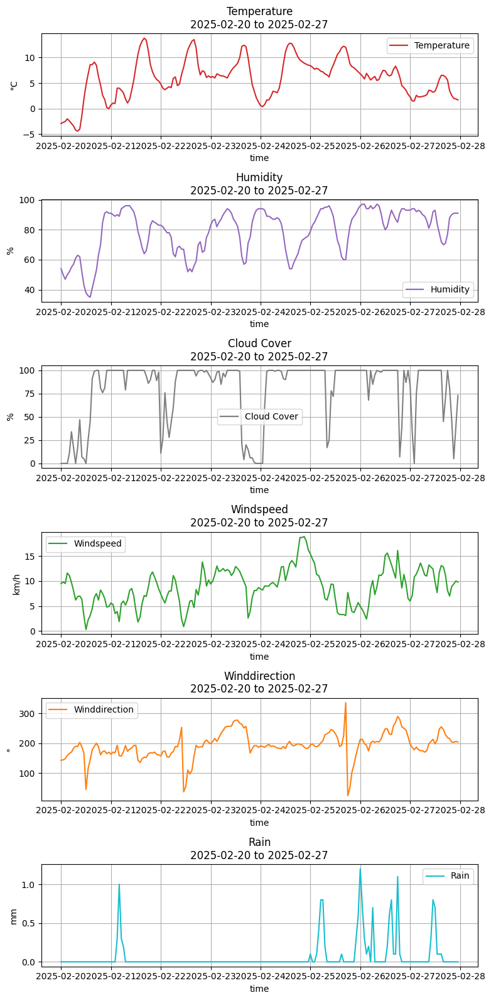

In [11]:
fig, axs = plt.subplots(len(w_data), 1, figsize=(8, 16), sharex=False)

for i in range(len(w_data)):
    ax = axs[i] if len(weather_columns) > 1 else axs
    ax.plot(weather.index, weather[w_data[i]["header"]], label =w_data[i]["label"], color=w_data[i]["color"])

    ax.grid()
    ax.legend(loc='best')
    ax.set_title(f'{w_data[i]["label"]}\n{weather.index[0].strftime("%Y-%m-%d")} to {weather.index[-1].strftime("%Y-%m-%d")}')
    ax.set_xlabel("time")
    ax.set_ylabel(w_data[i]["unit"])

plt.tight_layout()
plt.show()

# Aufbereitung der Messdaten

In [12]:
filename ='20_02_to_26_02_Sundhausen to FZE port 2.csv'
skip = 8
sep = ";"

columns = ['Time[date hh:mm:ss] ', ' Elapsed Time [hh:mm:ss:ms]', ' Normalized s 1 ', ' Normalized s 2 ', ' Normalized s 3 ', ' S 0 [mW]', ' S 1 [mW]', ' S 2 [mW]', ' S 3 [mW]', ' Azimuth[°] ', ' Ellipticity[°] ', ' DOP[%] ', ' DOCP[%] ', ' DOLP[%] ', ' Power[mW] ', ' Pol Power[mW] ', ' Unpol Power[mW] ', ' Power[dBm] ', ' Pol Power[dBm] ', ' Unpol Power[dBm] ', ' Power-Split-Ratio ', ' Phase Difference[°] ', ' Warning']
for c in range(len(columns)):
    print(c, ': ', columns[c])

0 :  Time[date hh:mm:ss] 
1 :   Elapsed Time [hh:mm:ss:ms]
2 :   Normalized s 1 
3 :   Normalized s 2 
4 :   Normalized s 3 
5 :   S 0 [mW]
6 :   S 1 [mW]
7 :   S 2 [mW]
8 :   S 3 [mW]
9 :   Azimuth[°] 
10 :   Ellipticity[°] 
11 :   DOP[%] 
12 :   DOCP[%] 
13 :   DOLP[%] 
14 :   Power[mW] 
15 :   Pol Power[mW] 
16 :   Unpol Power[mW] 
17 :   Power[dBm] 
18 :   Pol Power[dBm] 
19 :   Unpol Power[dBm] 
20 :   Power-Split-Ratio 
21 :   Phase Difference[°] 
22 :   Warning


# Zusammenhang zwischen Messdaten und Wetterdaten
## Polarisationsgrad (DOP[%])

In [13]:
degree = pd.read_csv(filename,skiprows=skip, sep=sep, usecols=[columns[0], columns[11]])

In [14]:
degree[columns[0]] = pd.to_datetime(degree[columns[0]])
degree.set_index(columns[0], inplace=True)

In [15]:
degree = degree[columns[11]]
degree = degree.drop(degree[(degree > 140) | (degree < 0)].index)

degree_daily = degree.groupby(degree.index.date)
degree_daily_list = list(degree_daily)

In [16]:
weather_daily = weather.groupby(weather.index.date)
weather_daily_list = list(weather_daily)

### Originaldaten

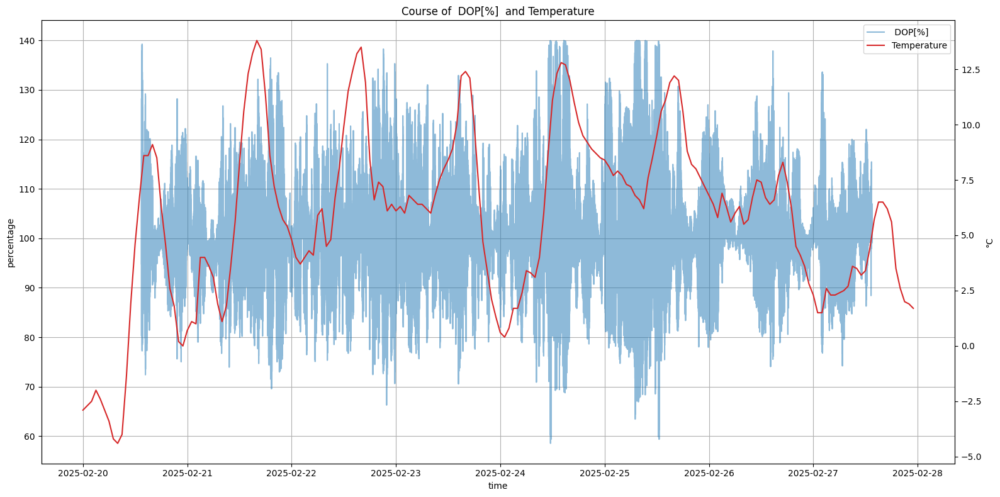

In [17]:
current = 0 #Temperature

fig, ax1 = plt.subplots(figsize=(16, 8))
   
ax1.plot(degree.index, degree, label=columns[11], color="tab:blue", alpha = 0.5 )
ax1.set_xlabel('time')
ax1.set_ylabel('percentage')
h1, l1 = ax1.get_legend_handles_labels()

ax2 = ax1.twinx()

ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
ax2.set_ylabel(w_data[current]["unit"])
h2, l2 = ax2.get_legend_handles_labels()

ax1.grid()
ax1.legend(h1+h2, l1+l2, loc="best")
ax1.set_title(f'Course of {columns[11]} and {w_data[current]["label"]}')
    
plt.tight_layout()
plt.show()

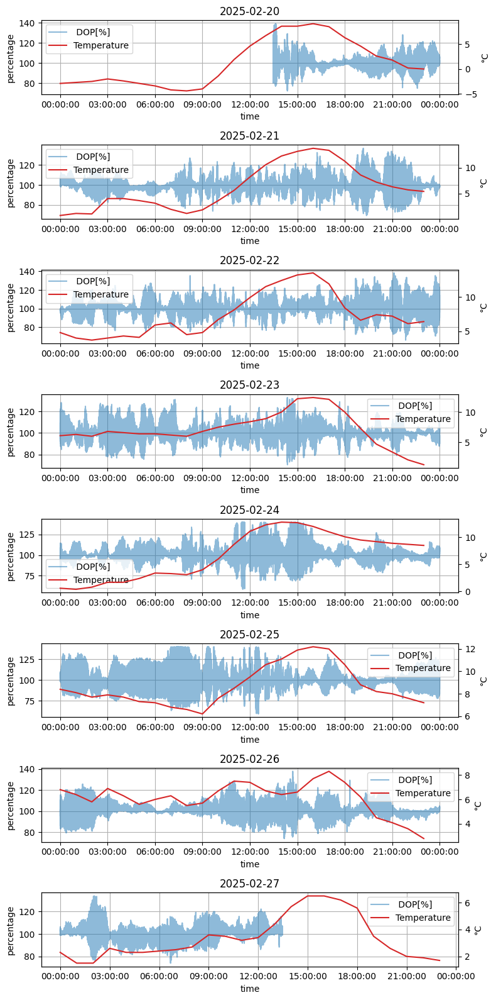

In [18]:
current = 0 # Temperature

fig, axs = plt.subplots(len(degree_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(degree_daily_list)):
    ax1 = axs[i] if len(degree_daily_list) > 1 else axs
    df_day = degree_daily_list[i][1]

    ax1.plot(df_day.index, df_day, label=columns[11], alpha=0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('percentage')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax2 = ax1.twinx()
    
    ax2.plot(weather_daily_list[i][1].index, weather_daily_list[i][1][w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(degree_daily_list[i][0])
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

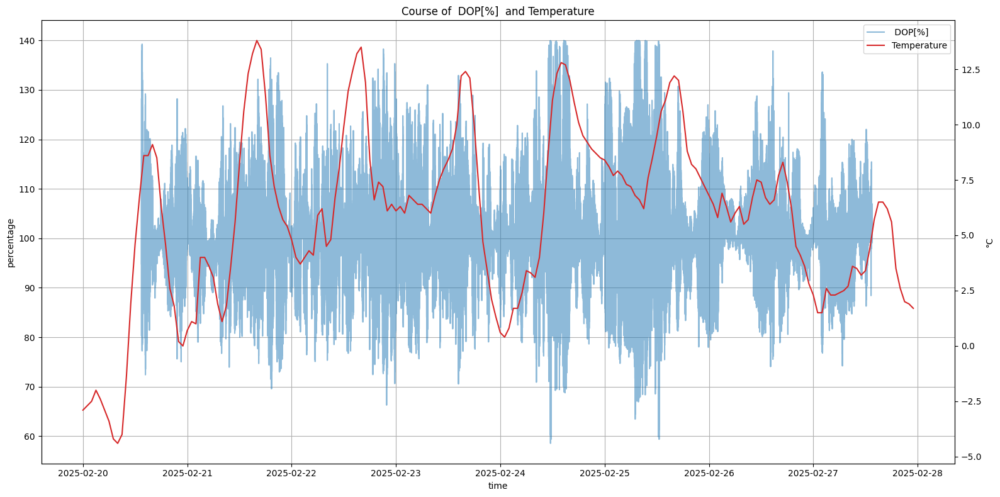

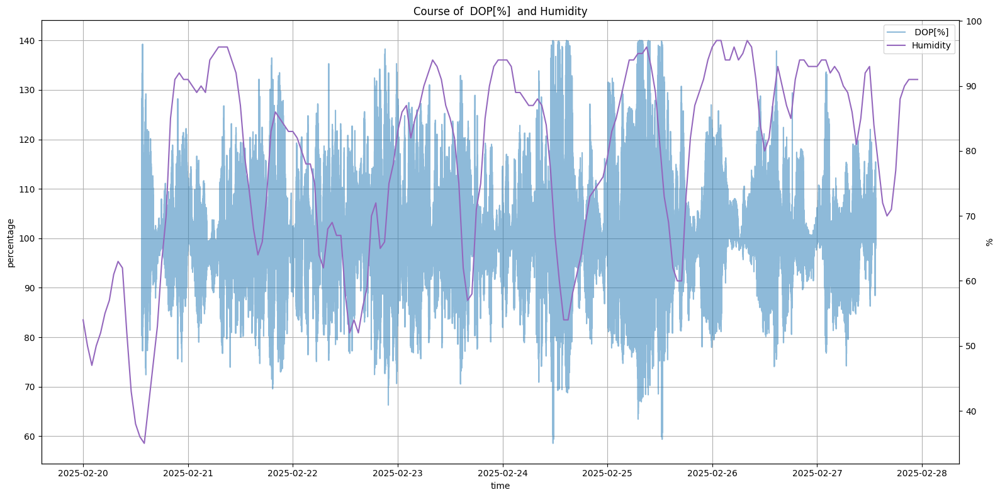

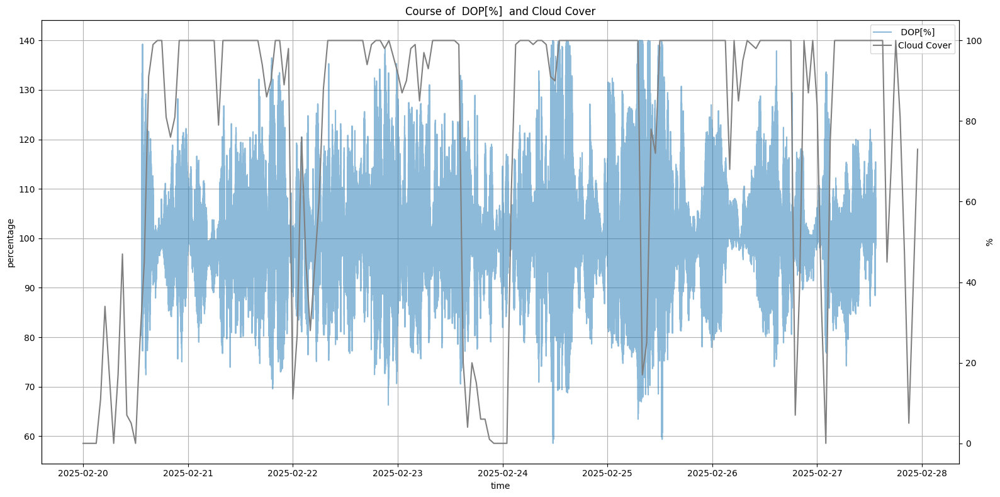

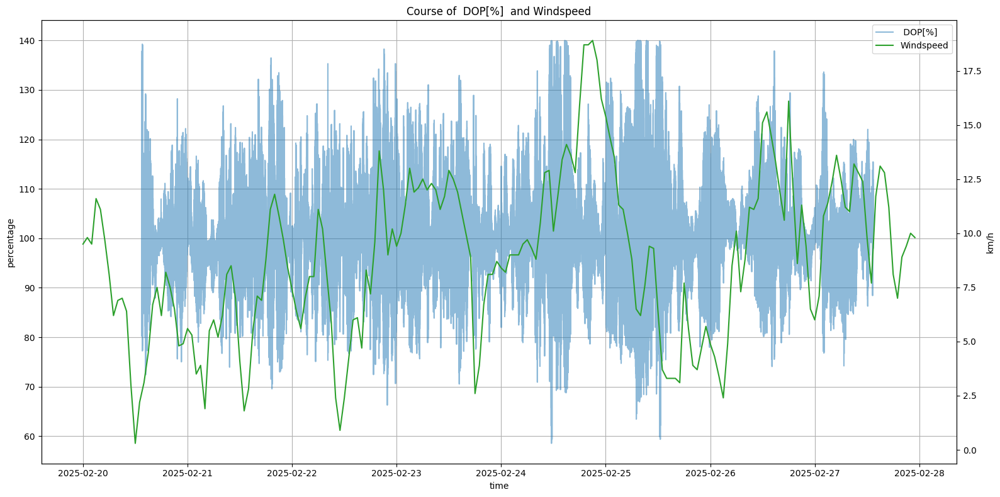

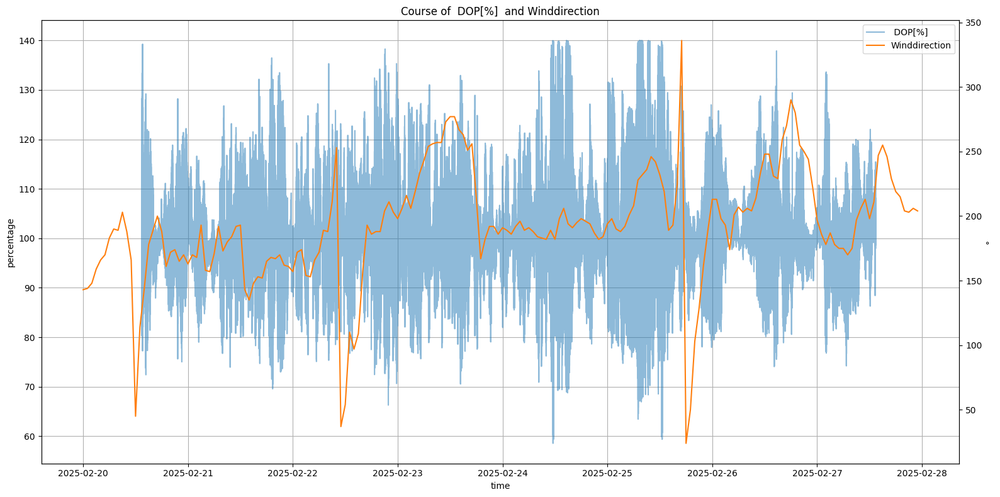

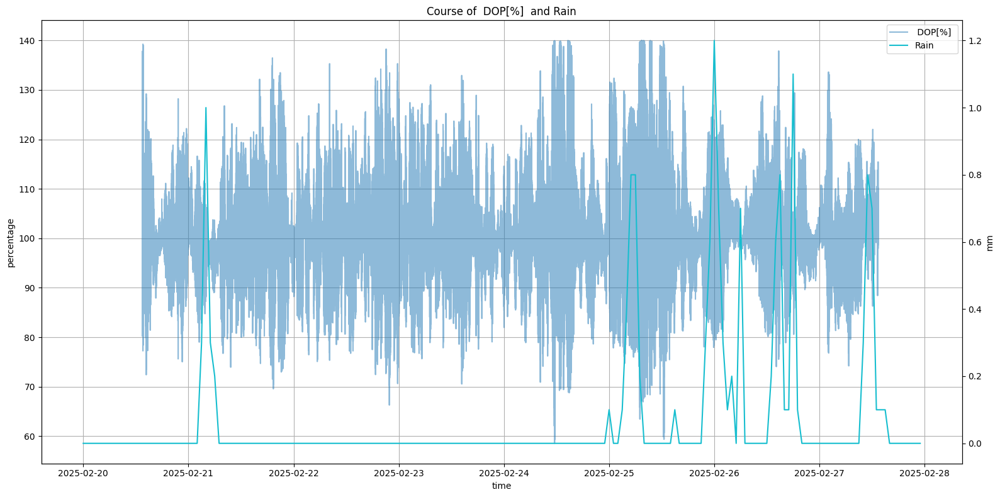

In [19]:
for current in range(len(w_data)):
    fig, ax1 = plt.subplots(figsize=(16, 8))

    ax1.plot(degree.index, degree, label=columns[11], color="tab:blue", alpha = 0.5 )
    ax1.set_xlabel('time')
    ax1.set_ylabel('percentage')
    h1, l1 = ax1.get_legend_handles_labels()

    ax2 = ax1.twinx()

    ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()

    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Course of {columns[11]} and {w_data[current]["label"]}')

    plt.tight_layout()
    plt.show()

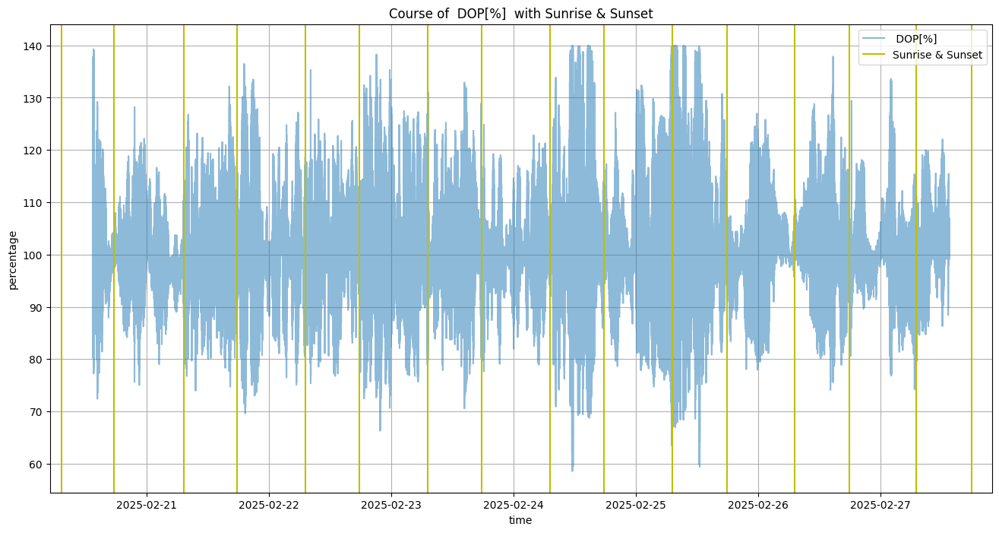

In [20]:
# Sunlight (day-night context)

plt.figure(figsize = (16,8))
plt.plot(degree.index, degree, label=columns[11], alpha = 0.5)
for i in range(len(sunrise)):
    plt.axvline(x = sunrise[i], color = 'y')
    if i == 0: plt.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset')
    else: plt.axvline(x = sunset[i], color = 'y')
plt.grid()
plt.legend(loc = 'best')
plt.title(f'Course of {columns[11]} with Sunrise & Sunset')
plt.xlabel('time')
plt.ylabel('percentage')
plt.show()

### Anwendung von Tief- und Hochpassfiltern

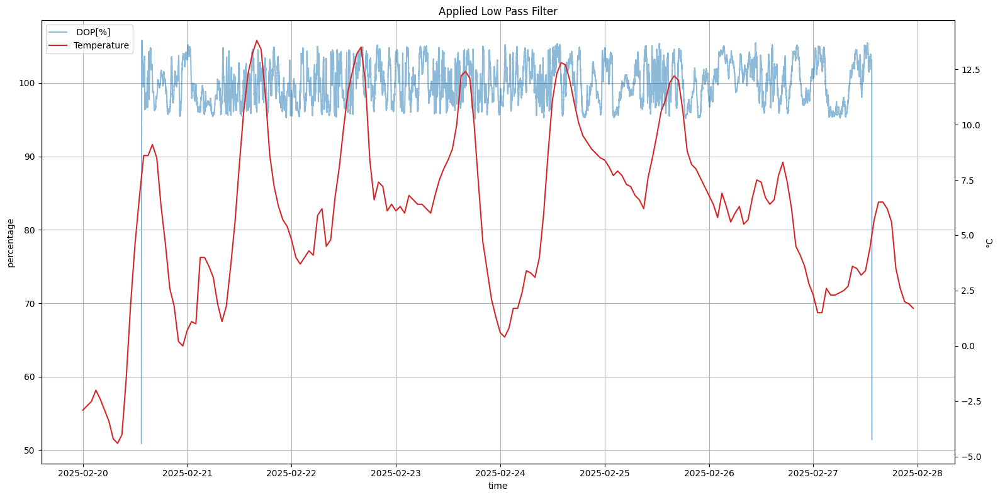

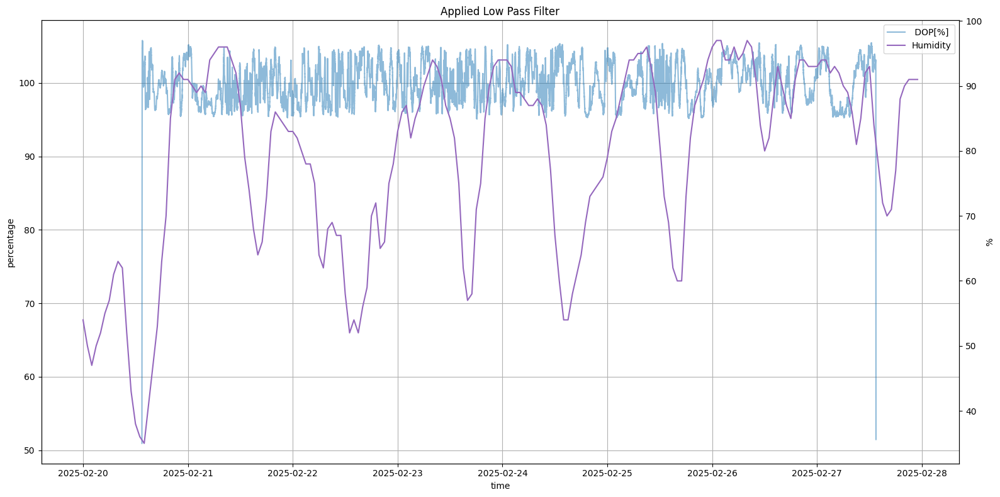

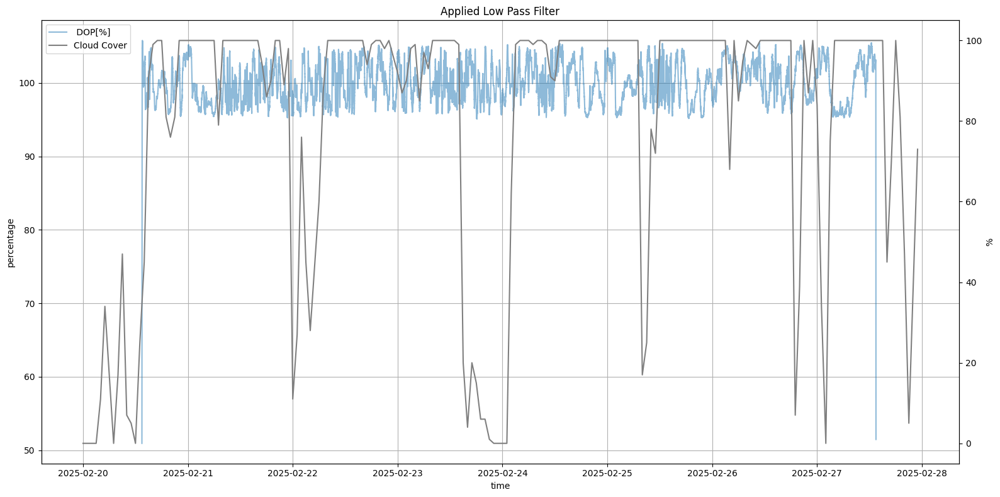

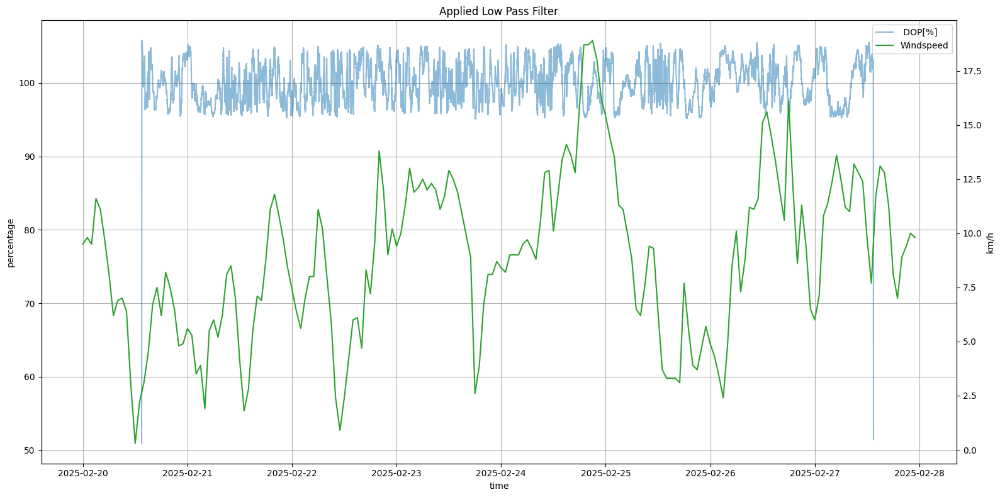

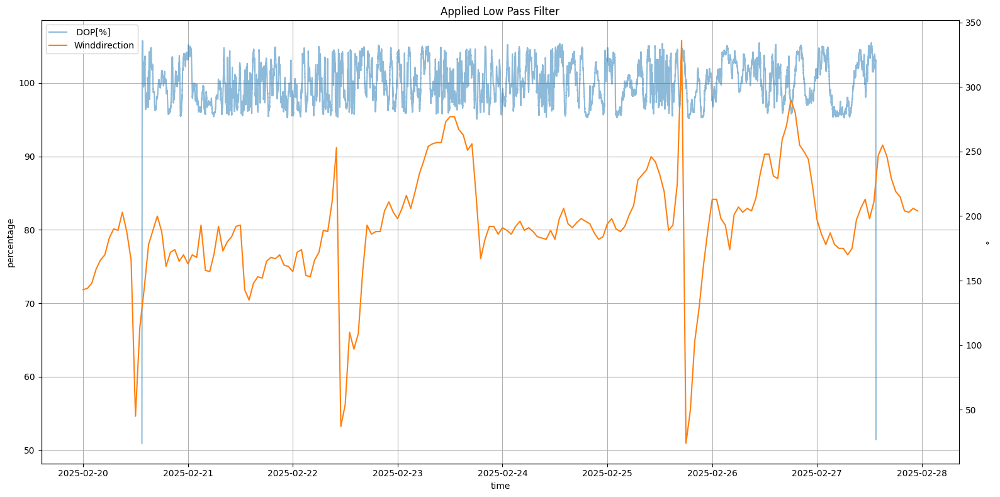

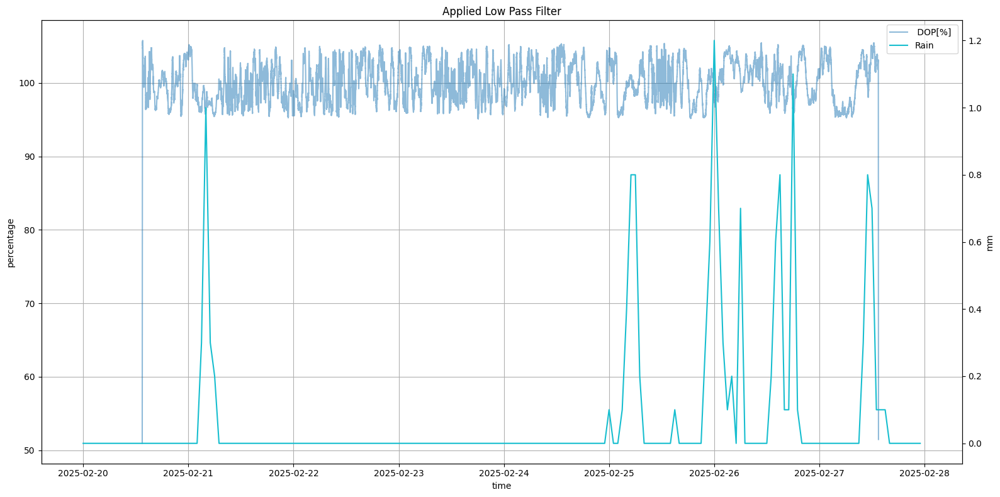

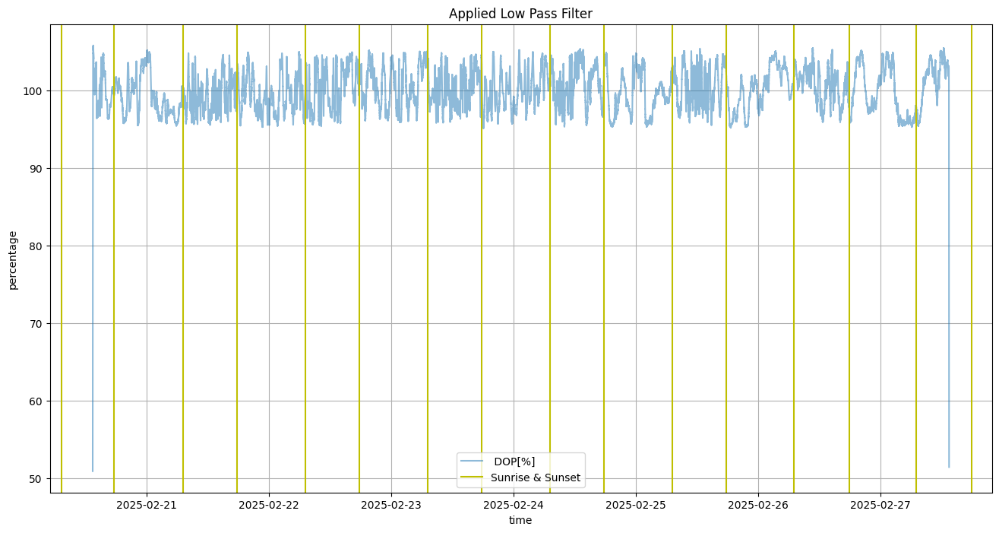

In [21]:
for current in range(len(w_data)):
    fig, ax1 = plt.subplots(figsize=(16, 8))

    ydata = np.array(degree)
    lps = lowpass(ydata, 1000)

    ax1.plot(degree.index, lps[:-1] , label=columns[11], color="tab:blue", alpha = 0.5 )
    ax1.set_xlabel('time')
    ax1.set_ylabel('percentage')
    h1, l1 = ax1.get_legend_handles_labels()

    ax2 = ax1.twinx()

    ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()

    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter')

    plt.tight_layout()
    plt.show()


# Sunlight (day-night context)

plt.figure(figsize = (16,8))
ydata = np.array(degree)
lps = lowpass(ydata, 1000)
plt.plot(degree.index, lps[:-1], label=columns[11], alpha = 0.5)
for i in range(len(sunrise)):
    plt.axvline(x = sunrise[i], color = 'y')
    if i == 0: plt.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset')
    else: plt.axvline(x = sunset[i], color = 'y')
plt.grid()
plt.legend(loc = 'best')
plt.title(f'Applied Low Pass Filter')
plt.xlabel('time')
plt.ylabel('percentage')
plt.show()

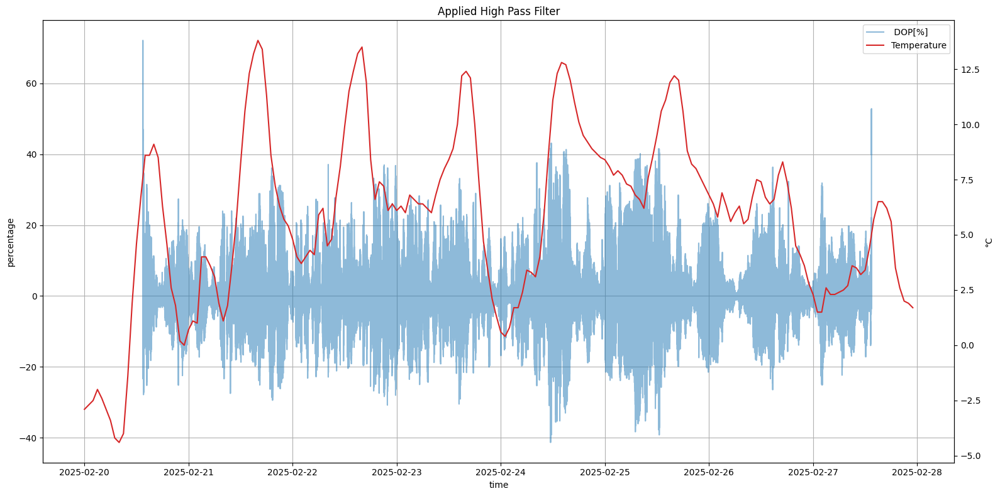

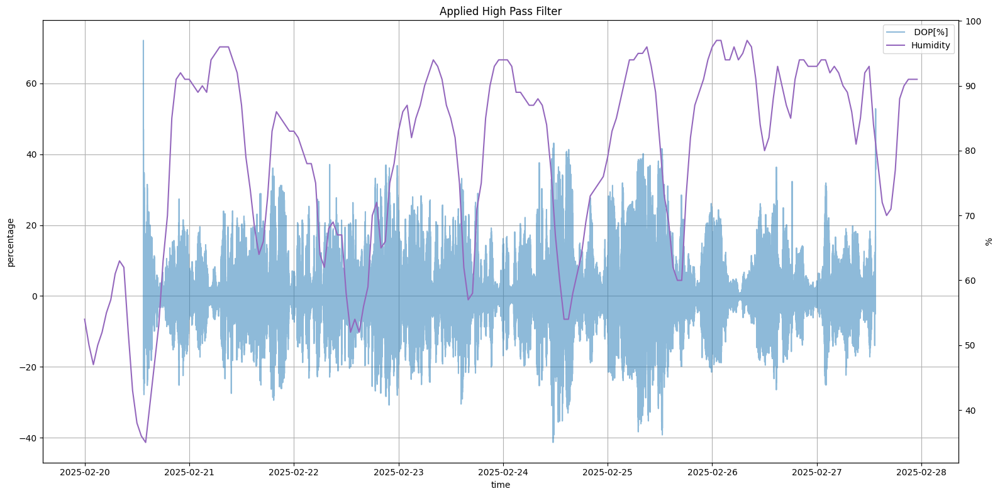

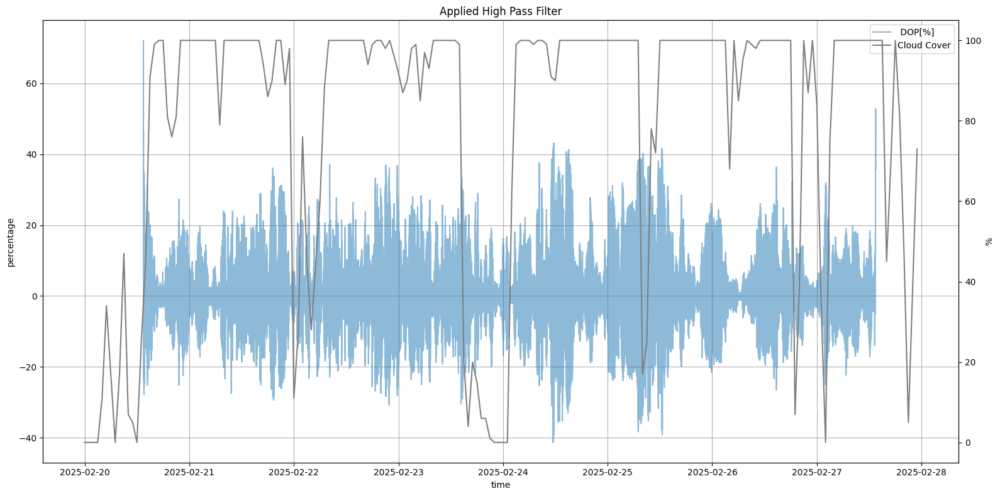

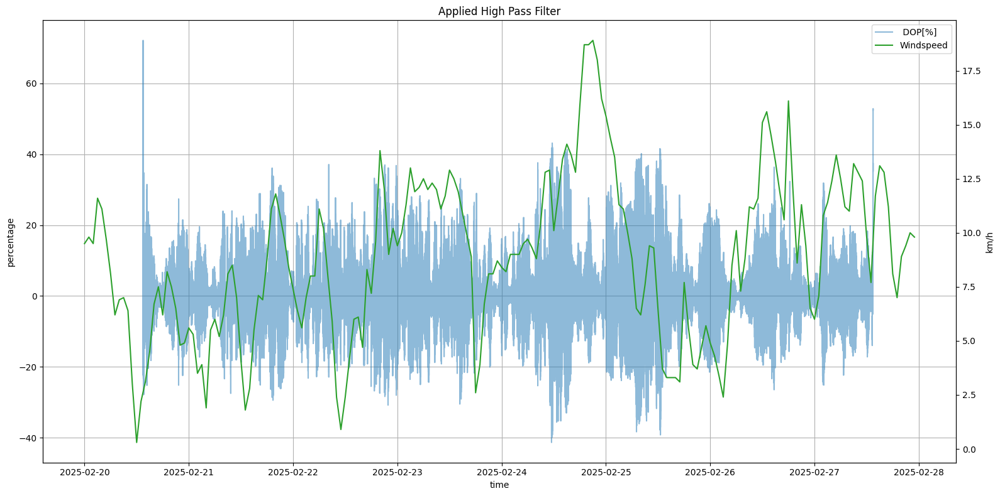

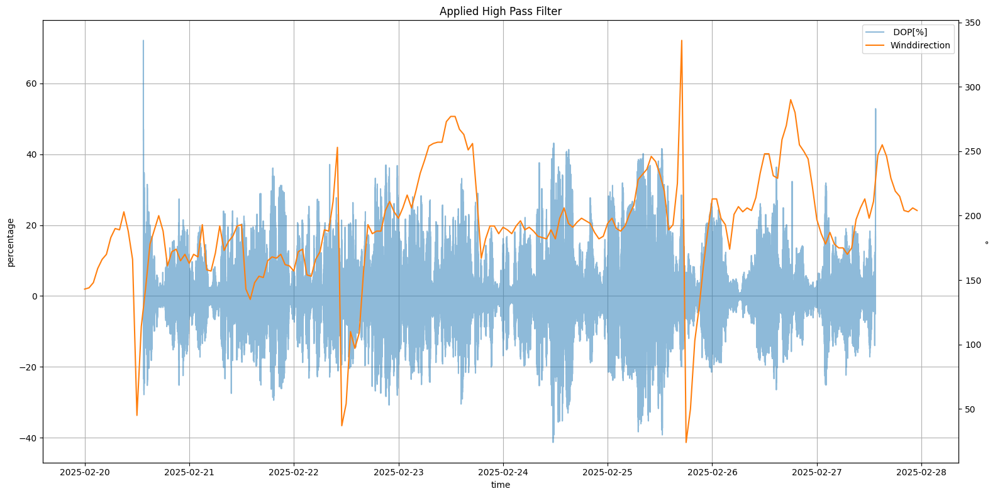

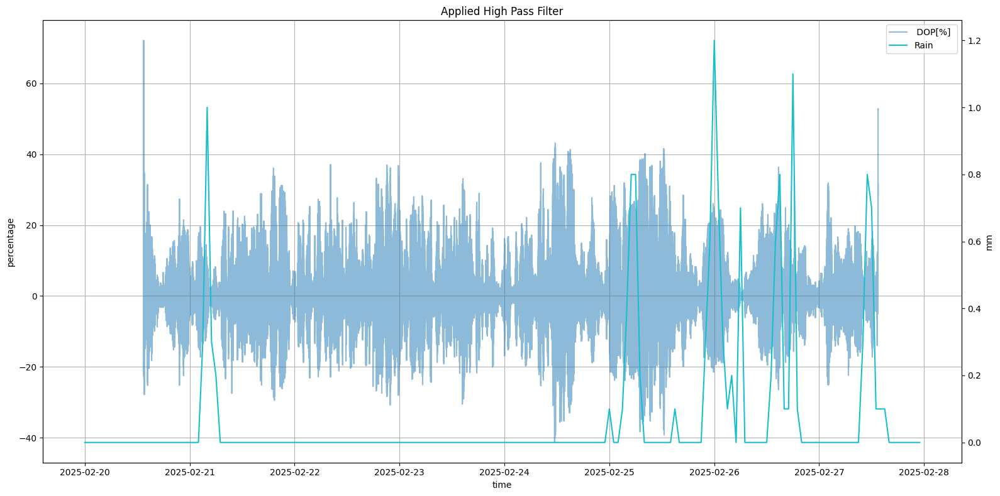

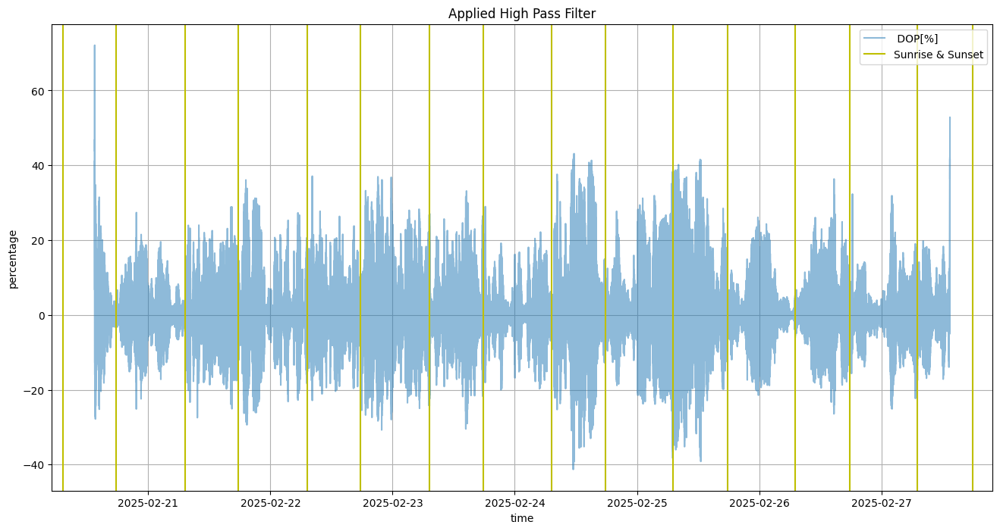

In [22]:
for current in range(len(w_data)):
    fig, ax1 = plt.subplots(figsize=(16, 8))

    ydata = np.array(degree)
    hps = highpass(ydata, 1000)

    ax1.plot(degree.index, hps , label=columns[11], color="tab:blue", alpha = 0.5 )
    ax1.set_xlabel('time')
    ax1.set_ylabel('percentage')
    h1, l1 = ax1.get_legend_handles_labels()

    ax2 = ax1.twinx()

    ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"])
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()

    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter')

    plt.tight_layout()
    plt.show()


# Sunlight (day-night context)

plt.figure(figsize = (16,8))
ydata = np.array(degree)
hps = highpass(ydata, 1000)
plt.plot(degree.index, hps, label=columns[11], alpha = 0.5)
for i in range(len(sunrise)):
    plt.axvline(x = sunrise[i], color = 'y')
    if i == 0: plt.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset')
    else: plt.axvline(x = sunset[i], color = 'y')
plt.grid()
plt.legend(loc = 'best')
plt.title(f'Applied High Pass Filter')
plt.xlabel('time')
plt.ylabel('percentage')
plt.show()

## Winkelparameter (Azimuth [°], Ellipticity[°])

In [23]:
angle = pd.read_csv(filename,skiprows=skip, sep=sep, usecols=[columns[0], columns[9], columns[10]])

In [24]:
angle[columns[0]] = pd.to_datetime(angle[columns[0]])
angle.set_index(columns[0], inplace=True)

In [25]:
angle_daily = angle.groupby(angle.index.date)
angle_daily_list = list(angle_daily)

angle_daily = angle.groupby(angle.index.date)
angle_daily_list = list(angle_daily)

### Originaldaten

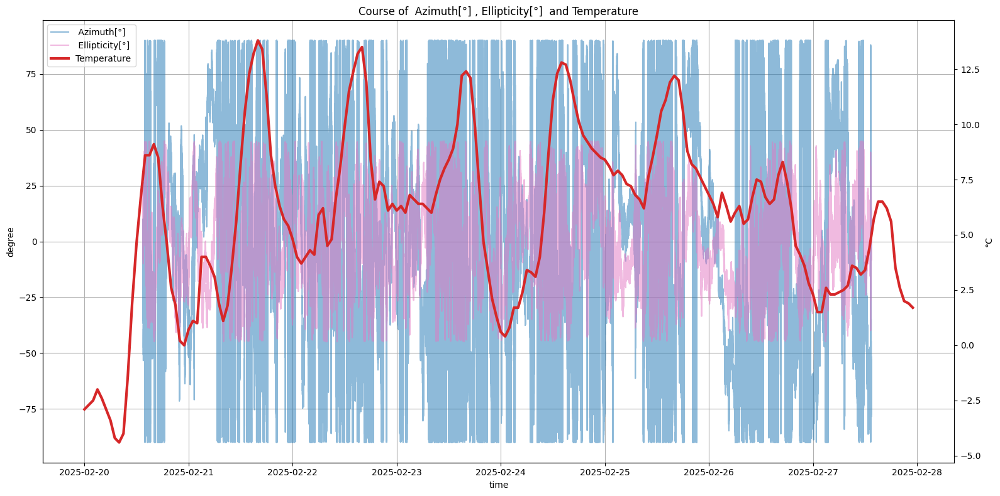

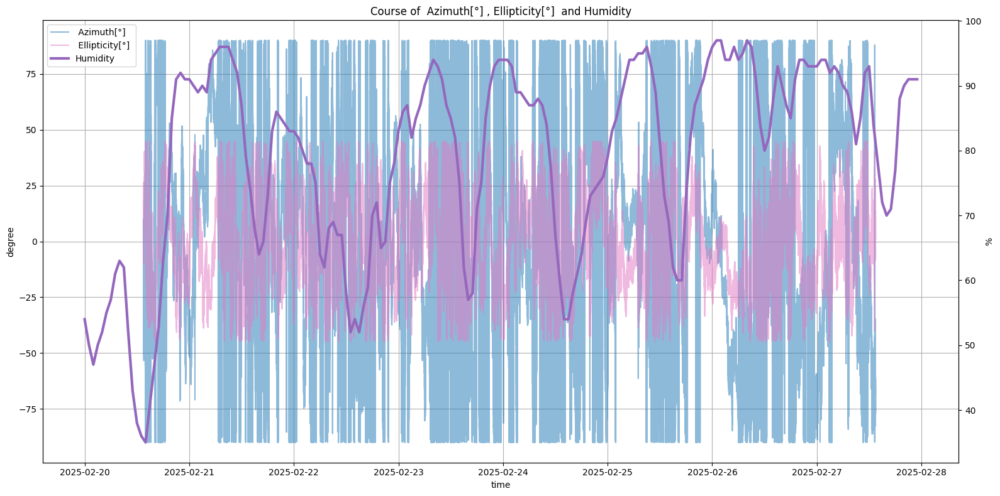

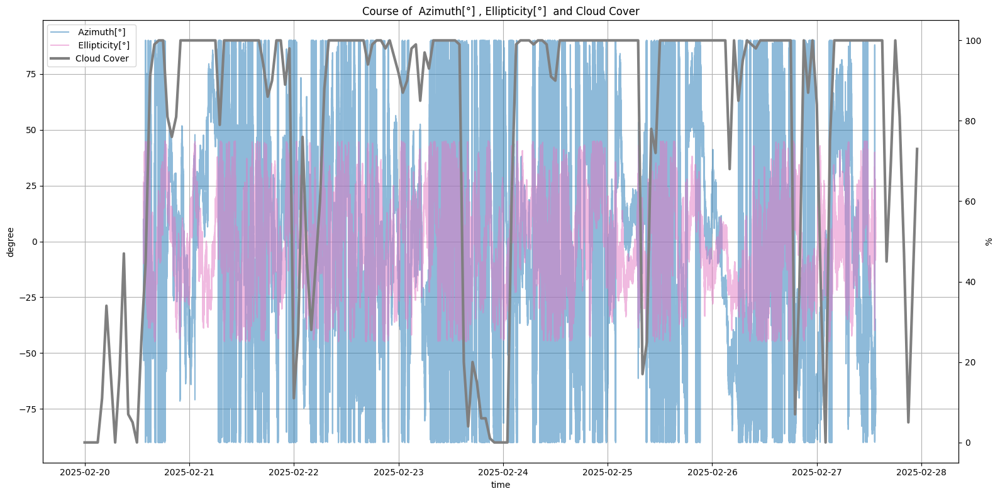

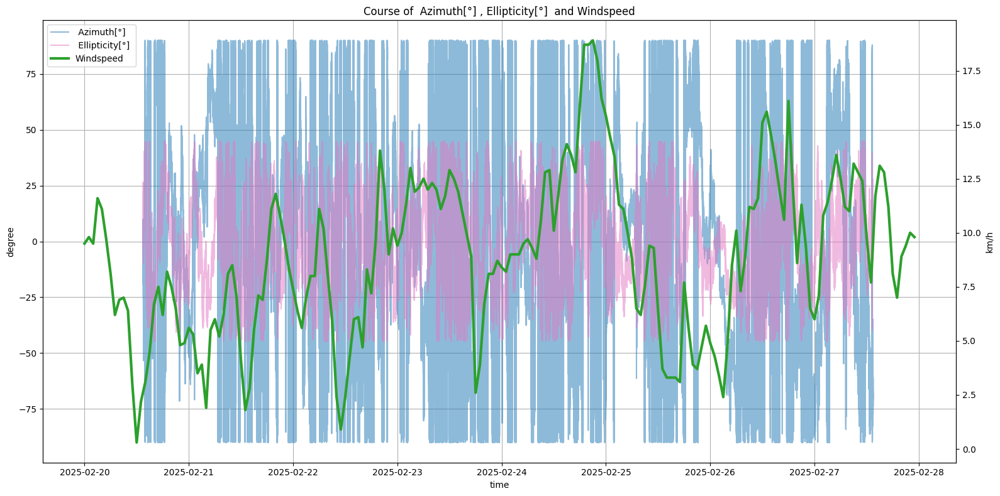

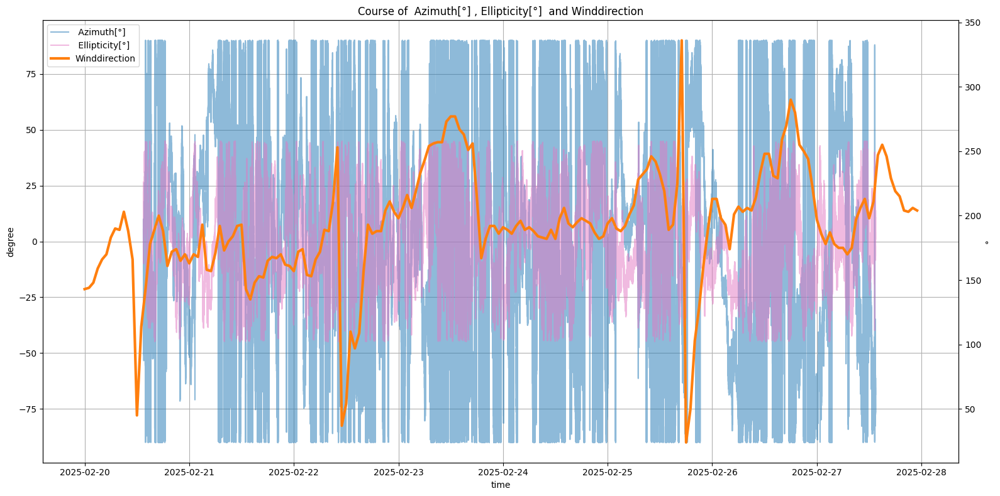

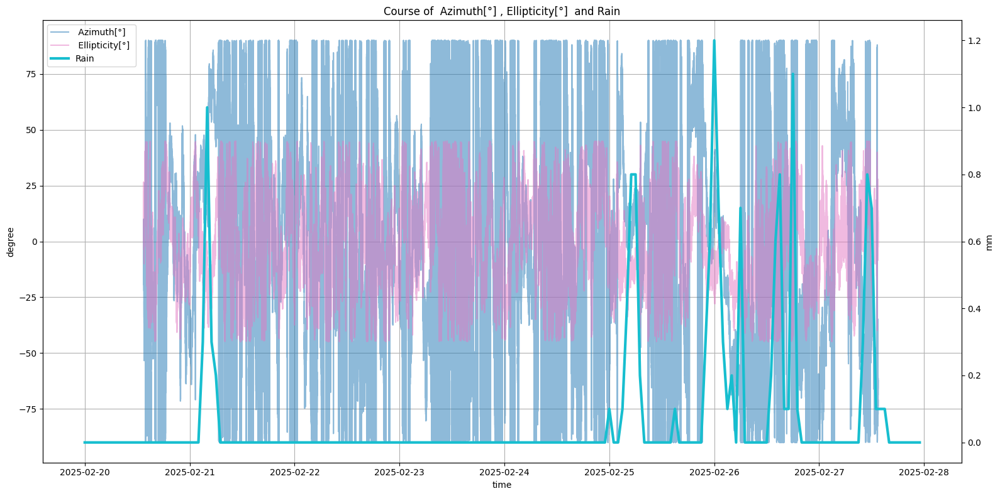

In [26]:
for current in range(len(w_data)):
    fig, ax1 = plt.subplots(figsize=(16, 8))

    ax1.plot(angle.index, angle[columns[9]], label=columns[9], color= "tab:blue", alpha= 0.5)
    ax1.plot(angle[columns[10]], label=columns[10], color= "tab:pink", alpha= 0.5)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()

    ax2 = ax1.twinx()

    ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"], linewidth=3)
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()

    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Course of {columns[9]},{columns[10]} and {w_data[current]["label"]}')

    plt.tight_layout()
    plt.show()

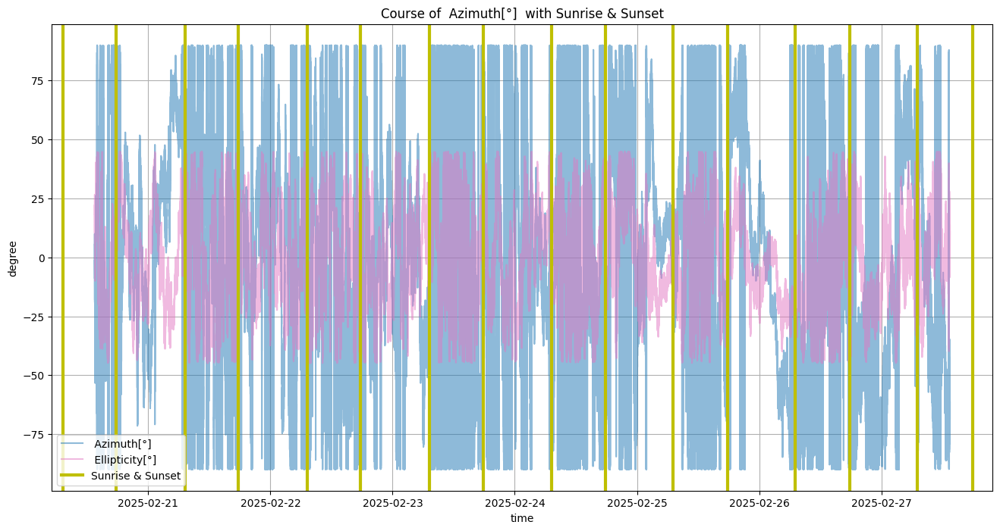

In [27]:
# Sunlight (day-night context)

plt.figure(figsize = (16,8))
plt.plot(angle.index, angle[columns[9]], label=columns[9], color= "tab:blue", alpha= 0.5)
plt.plot(angle.index, angle[columns[10]], label=columns[10], color= "tab:pink", alpha= 0.5)
for i in range(len(sunrise)):
    plt.axvline(x = sunrise[i], color = 'y', linewidth=3)
    if i == 0: plt.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset', linewidth=3)
    else: plt.axvline(x = sunset[i], color = 'y', linewidth=3)
plt.grid()
plt.legend(loc = 'best')
plt.title(f'Course of {columns[9]} with Sunrise & Sunset')
plt.xlabel('time')
plt.ylabel('degree')
plt.show()

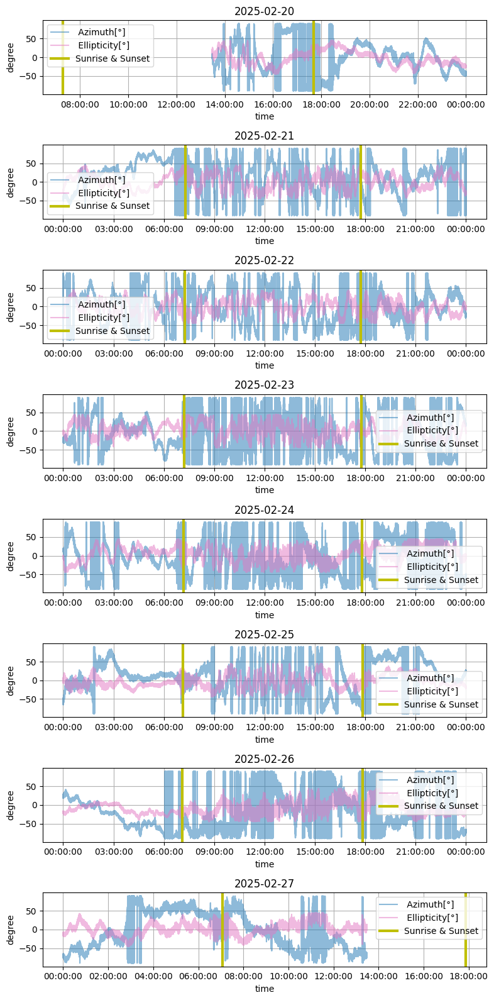

In [28]:
fig, axs = plt.subplots(len(angle_daily_list), 1, figsize=(8, 16), sharex=False)

for i in range(len(angle_daily_list)):
    ax1 = axs[i] if len(angle_daily_list) > 1 else axs
    az = angle_daily_list[i][1][columns[9]]
    el = angle_daily_list[i][1][columns[10]]

    ax1.plot(angle_daily_list[i][1].index, az, label=columns[9], color= "tab:blue", alpha= 0.5)
    ax1.plot(el, label=columns[10], color="tab:pink", alpha= 0.5)
    ax1.axvline(x = sunrise[i], color = 'y', linewidth=3)
    ax1.axvline(x = sunset[i], color = 'y', label = 'Sunrise & Sunset', linewidth=3)
    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()
    
    ax1.grid()
    ax1.legend(loc="best")
    ax1.set_title(degree_daily_list[i][0])
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    
plt.tight_layout()
plt.show()

### Anwendung des Tiefpassfilters

#### Azimuth

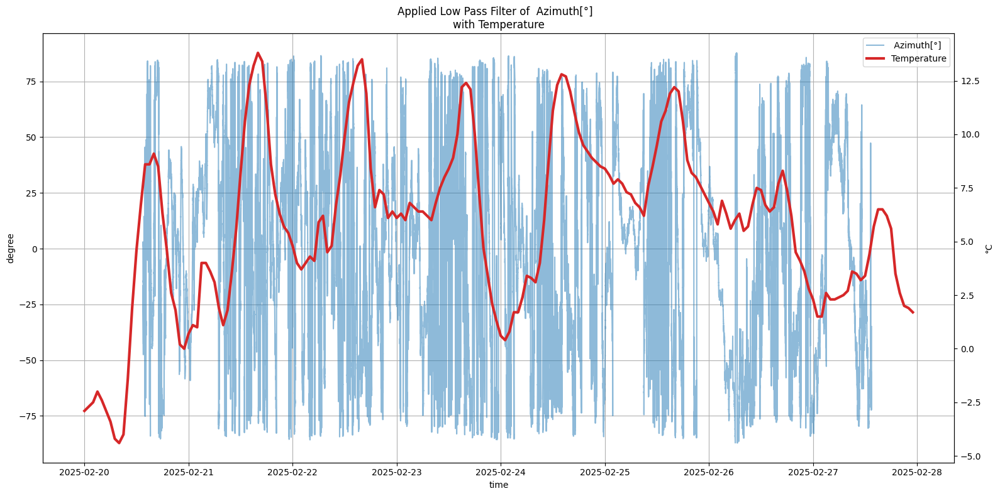

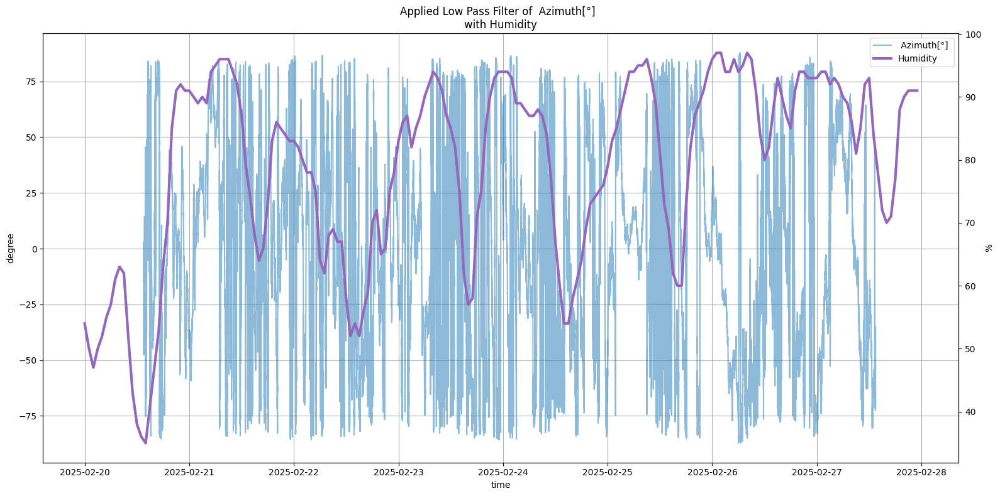

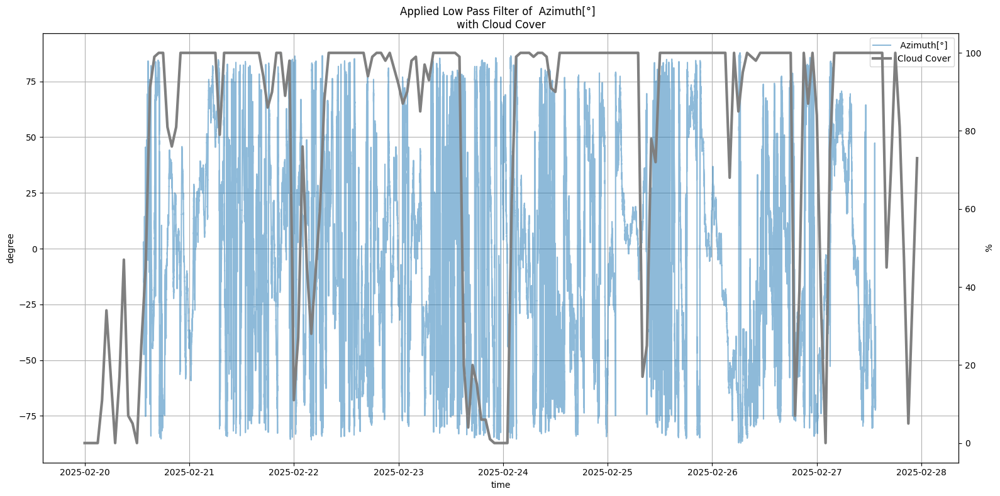

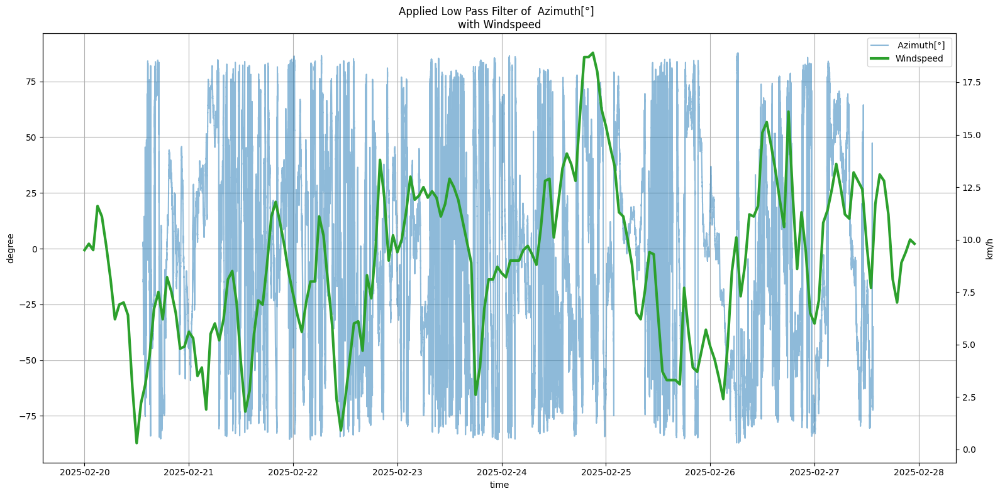

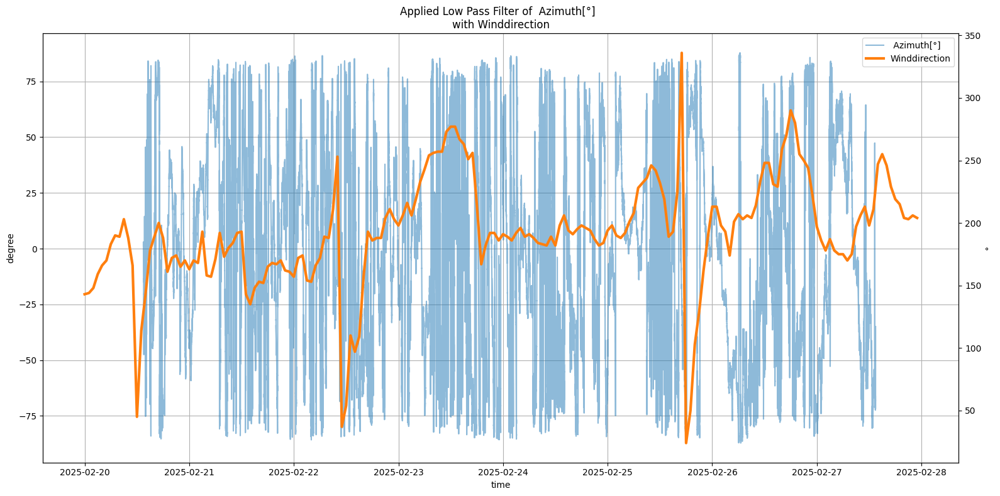

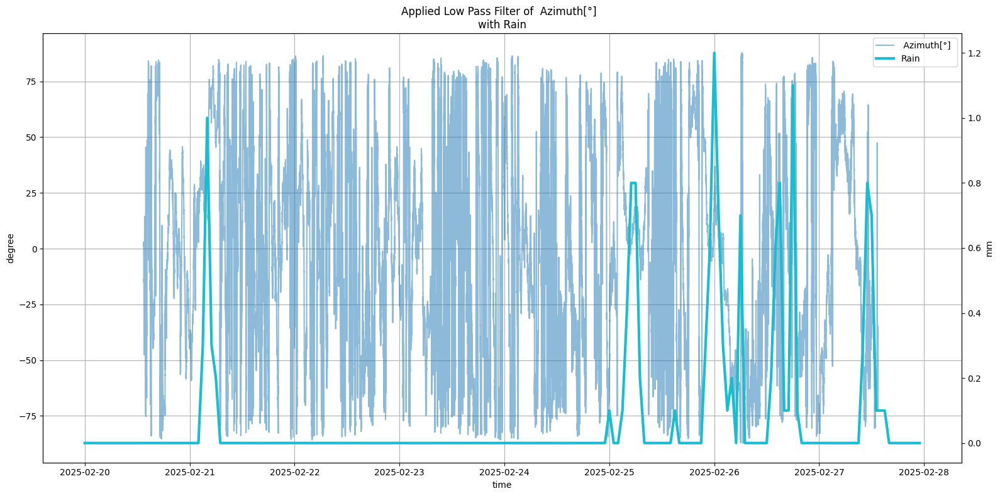

In [29]:
for current in range(len(w_data)):
    fig, ax1 = plt.subplots(figsize=(16, 8))

    ydata = np.array(angle[columns[9]])
    lps = lowpass(ydata, 100)

    ax1.plot(angle.index, lps[:-1], label=columns[9], color= "tab:blue", alpha= 0.5)

    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()

    ax2 = ax1.twinx()

    ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"], linewidth=3)
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()

    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter of {columns[9]} \nwith {w_data[current]["label"]}')

    plt.tight_layout()
    plt.show()

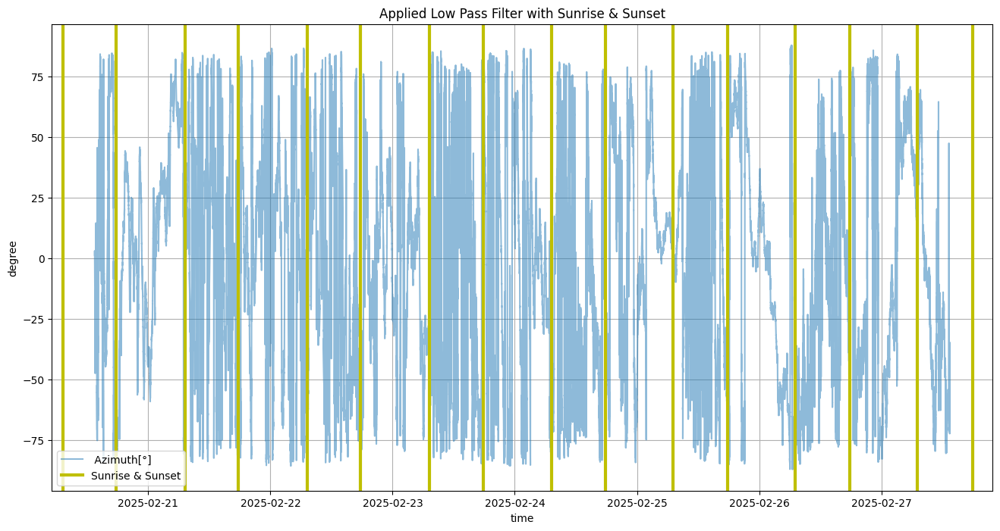

In [30]:
# Sunlight (day-night context)

plt.figure(figsize = (16,8))

ydata = np.array(angle[columns[9]])
lps = lowpass(ydata, 100)

plt.plot(angle.index, lps[:-1], label=columns[9], color= "tab:blue", alpha= 0.5)
for i in range(len(sunrise)):
    plt.axvline(x = sunrise[i], color = 'y', linewidth=3)
    if i == 0: plt.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset', linewidth=3)
    else: plt.axvline(x = sunset[i], color = 'y', linewidth=3)
plt.grid()
plt.legend(loc = 'best')
plt.title(f'Applied Low Pass Filter with Sunrise & Sunset')
plt.xlabel('time')
plt.ylabel('degree')
plt.show()

#### Ellipticity

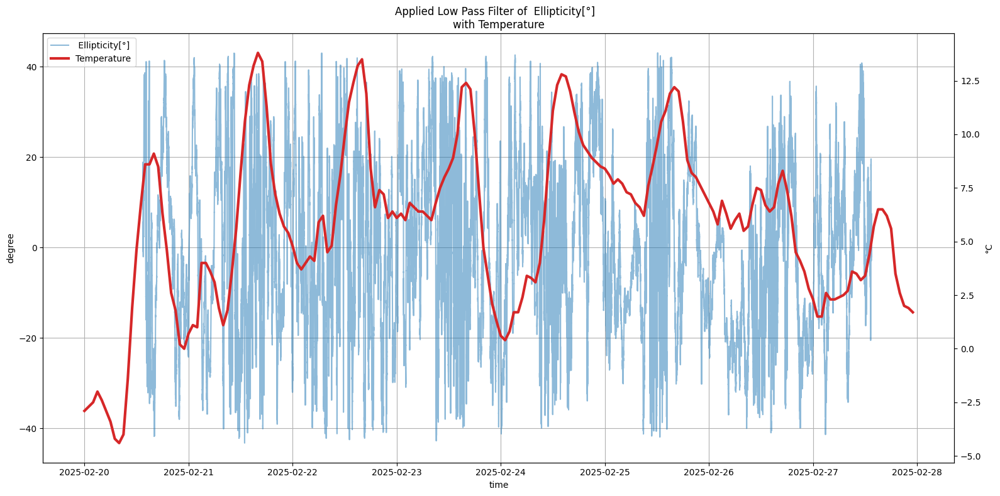

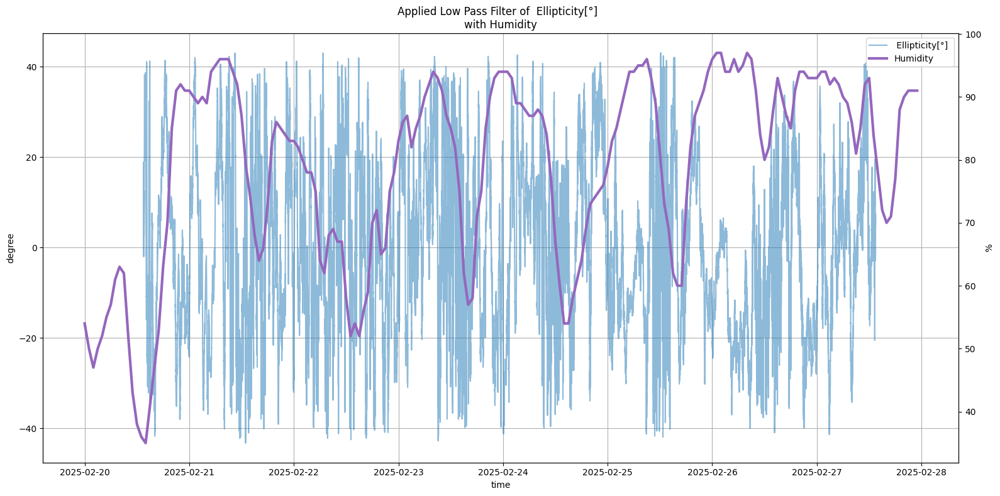

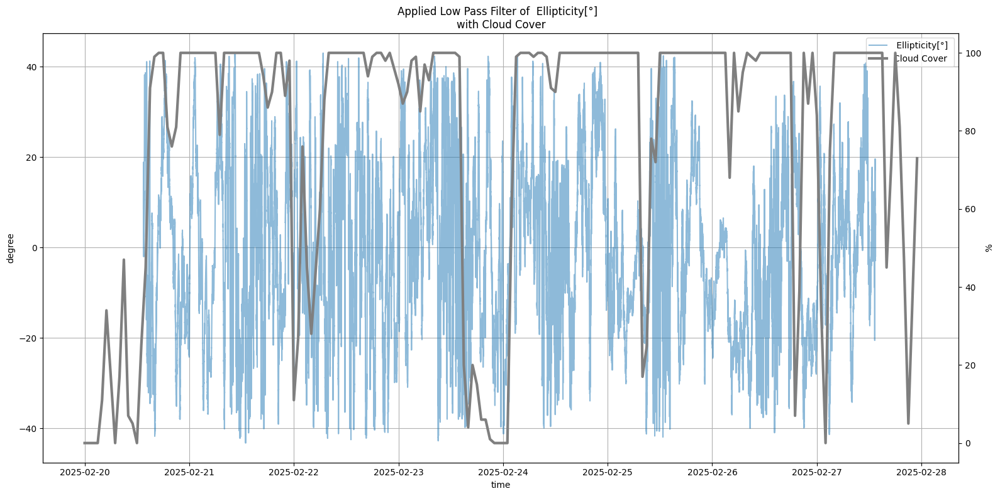

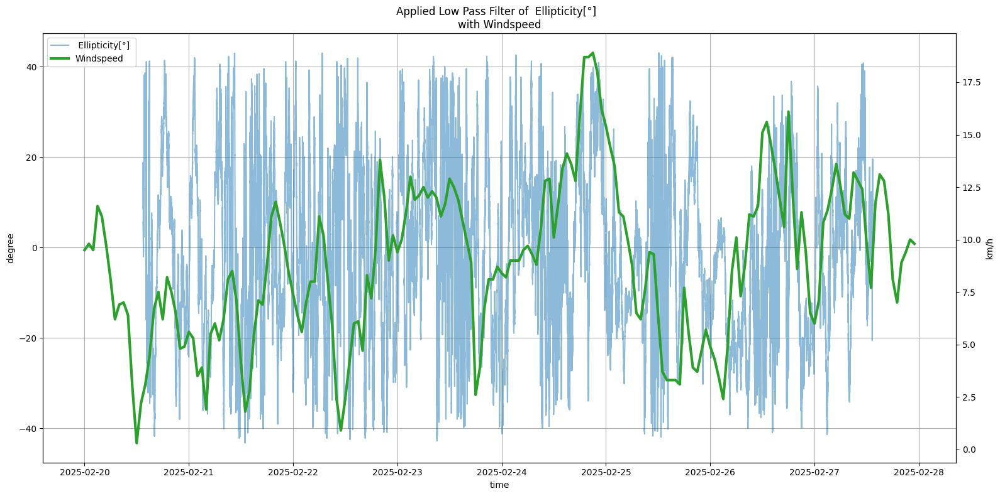

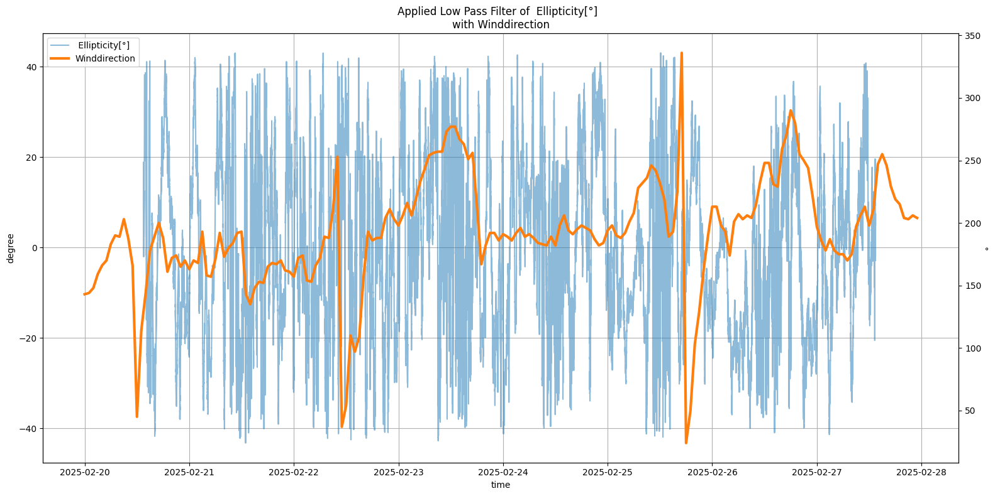

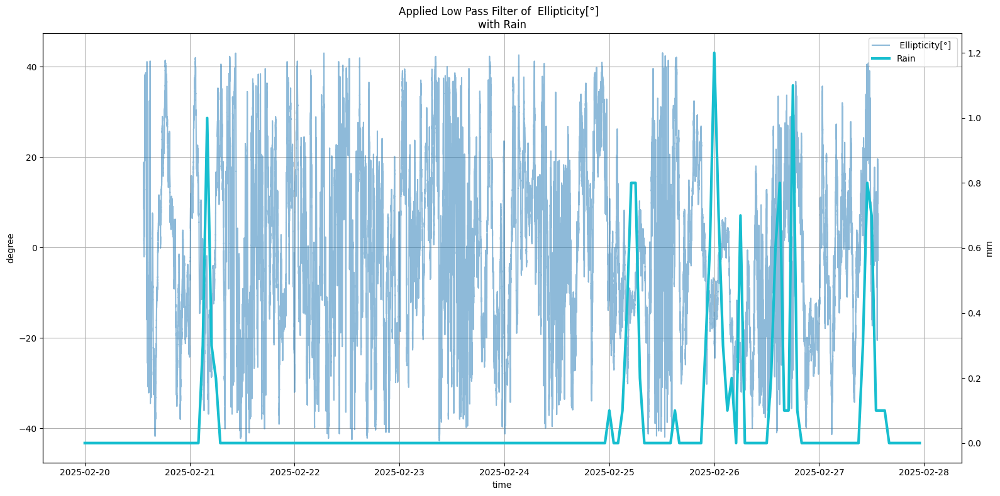

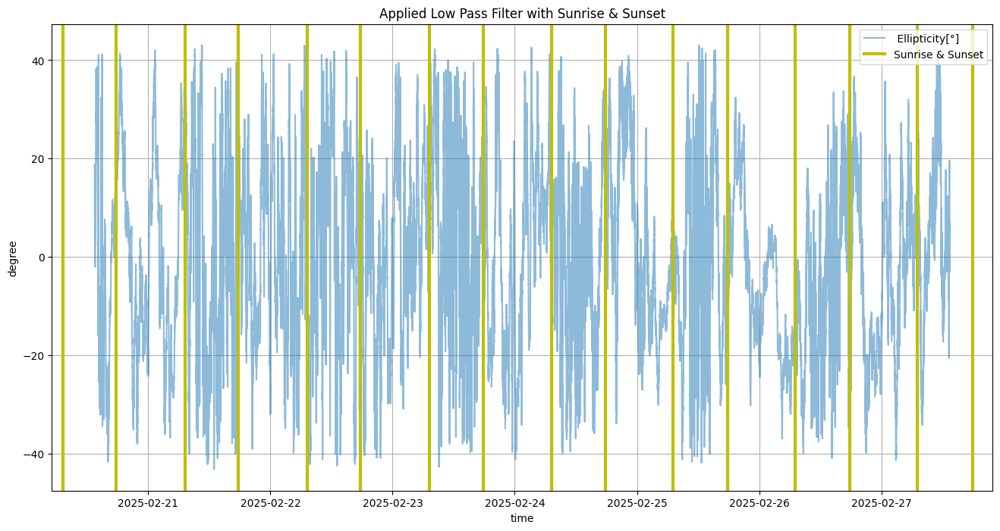

In [31]:
for current in range(len(w_data)):
    fig, ax1 = plt.subplots(figsize=(16, 8))

    ydata = np.array(angle[columns[10]])
    lps = lowpass(ydata, 100)

    ax1.plot(angle.index, lps[:-1], label=columns[10], color= "tab:blue", alpha= 0.5)

    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()

    ax2 = ax1.twinx()

    ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"], linewidth=3)
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()

    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied Low Pass Filter of {columns[10]} \nwith {w_data[current]["label"]}')

    plt.tight_layout()
    plt.show()


# Sunlight (day-night context)

plt.figure(figsize = (16,8))

ydata = np.array(angle[columns[10]])
lps = lowpass(ydata, 100)

plt.plot(angle.index, lps[:-1], label=columns[10], color= "tab:blue", alpha= 0.5)
for i in range(len(sunrise)):
    plt.axvline(x = sunrise[i], color = 'y', linewidth=3)
    if i == 0: plt.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset', linewidth=3)
    else: plt.axvline(x = sunset[i], color = 'y', linewidth=3)
plt.grid()
plt.legend(loc = 'best')
plt.title(f'Applied Low Pass Filter with Sunrise & Sunset')
plt.xlabel('time')
plt.ylabel('degree')
plt.show()

### Anwendung des Hochpassfilters

#### Azimuth

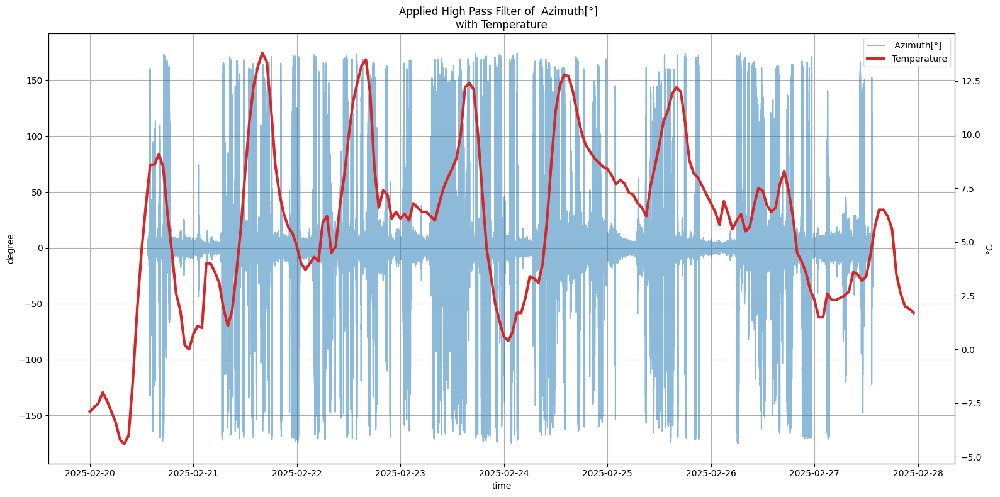

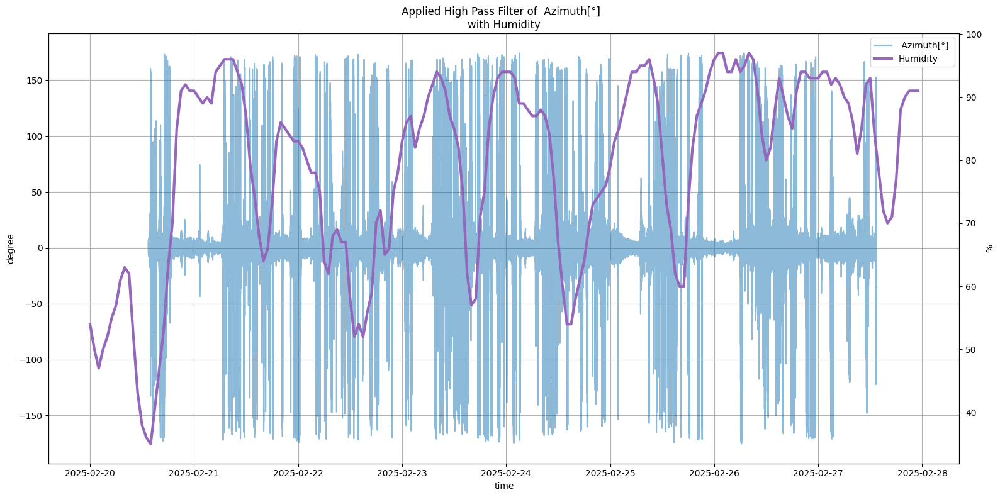

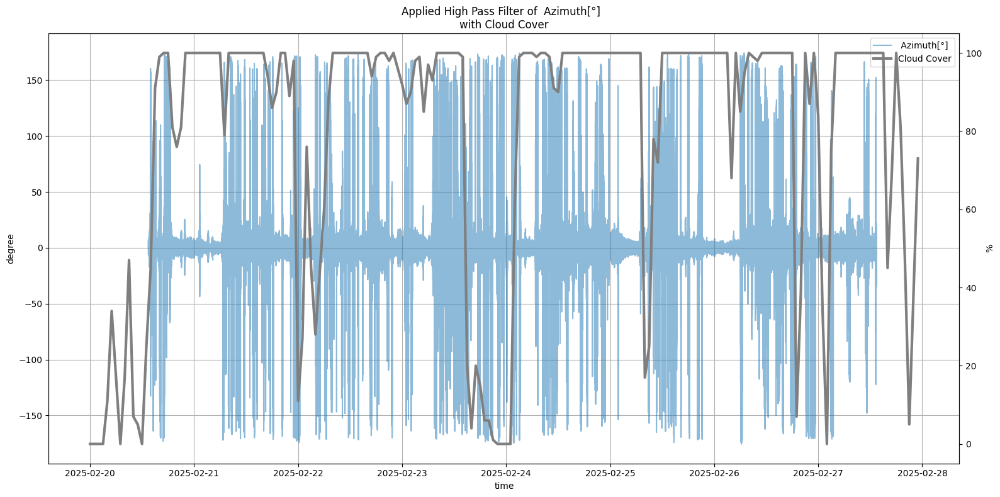

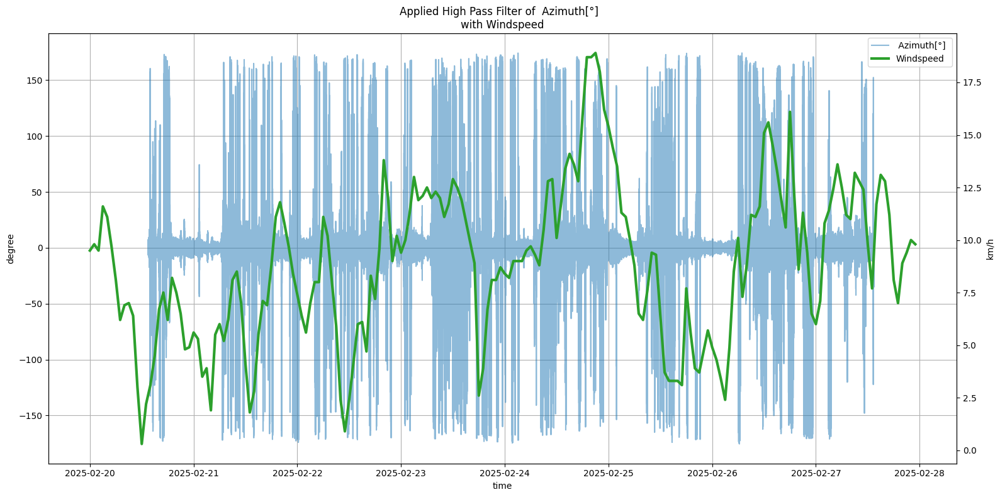

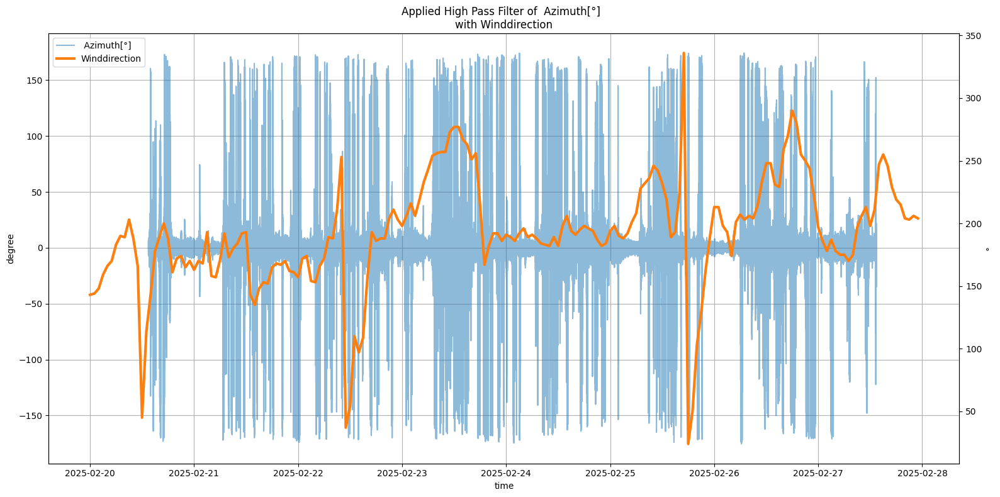

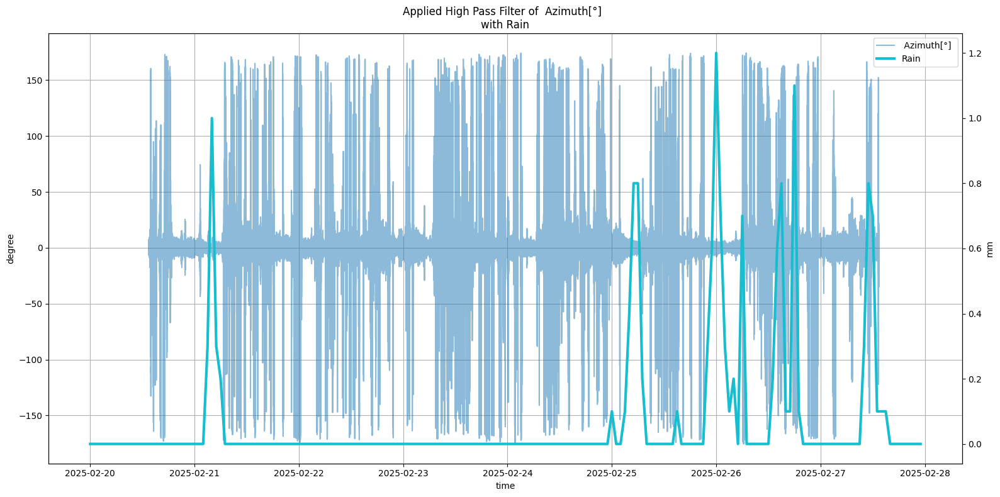

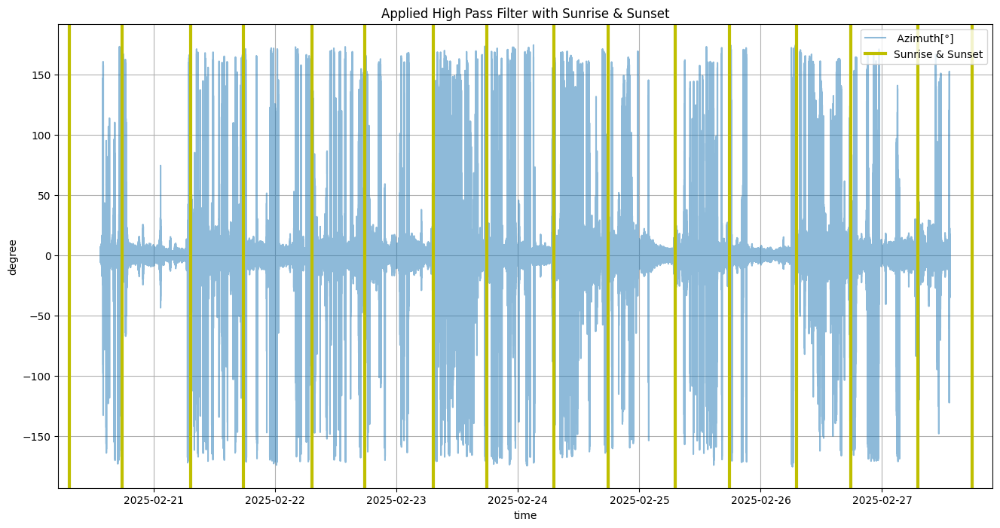

In [32]:
for current in range(len(w_data)):
    fig, ax1 = plt.subplots(figsize=(16, 8))

    ydata = np.array(angle[columns[9]])
    hps = highpass(ydata, 100)

    ax1.plot(angle.index, hps, label=columns[9], color= "tab:blue", alpha= 0.5)

    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()

    ax2 = ax1.twinx()

    ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"], linewidth=3)
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()

    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter of {columns[9]} \nwith {w_data[current]["label"]}')

    plt.tight_layout()
    plt.show()

# Sunlight (day-night context)

plt.figure(figsize = (16,8))

ydata = np.array(angle[columns[9]])
hps = highpass(ydata, 100)

plt.plot(angle.index, hps, label=columns[9], color= "tab:blue", alpha= 0.5)
for i in range(len(sunrise)):
    plt.axvline(x = sunrise[i], color = 'y', linewidth=3)
    if i == 0: plt.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset', linewidth=3)
    else: plt.axvline(x = sunset[i], color = 'y', linewidth=3)
plt.grid()
plt.legend(loc = 'best')
plt.title(f'Applied High Pass Filter with Sunrise & Sunset')
plt.xlabel('time')
plt.ylabel('degree')
plt.show()

#### Ellipticity

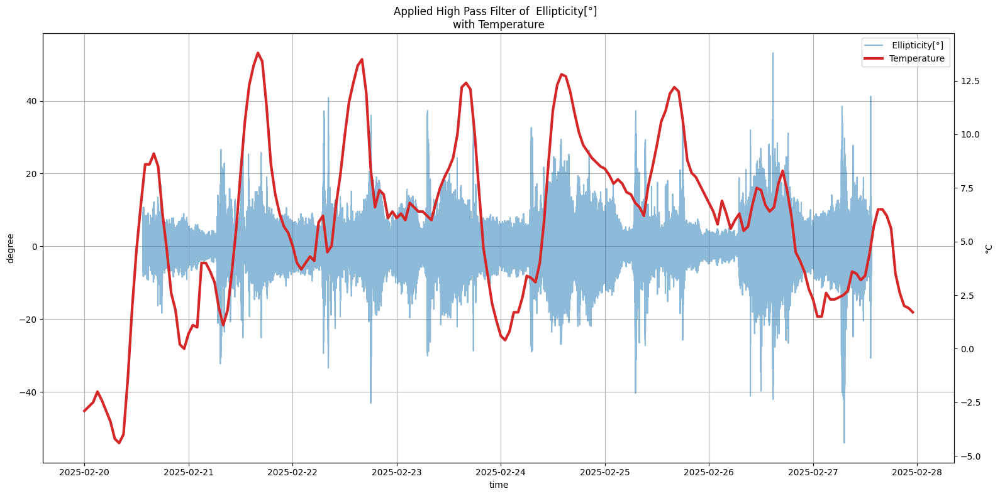

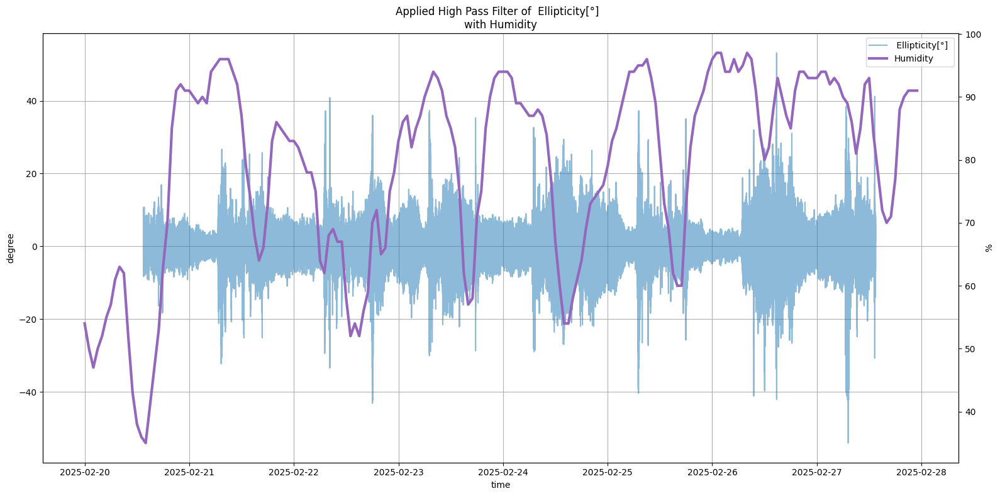

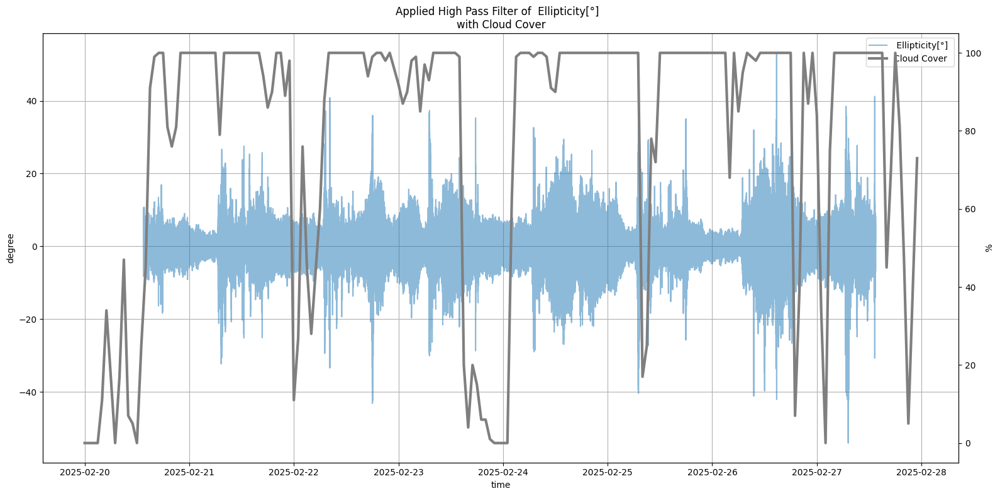

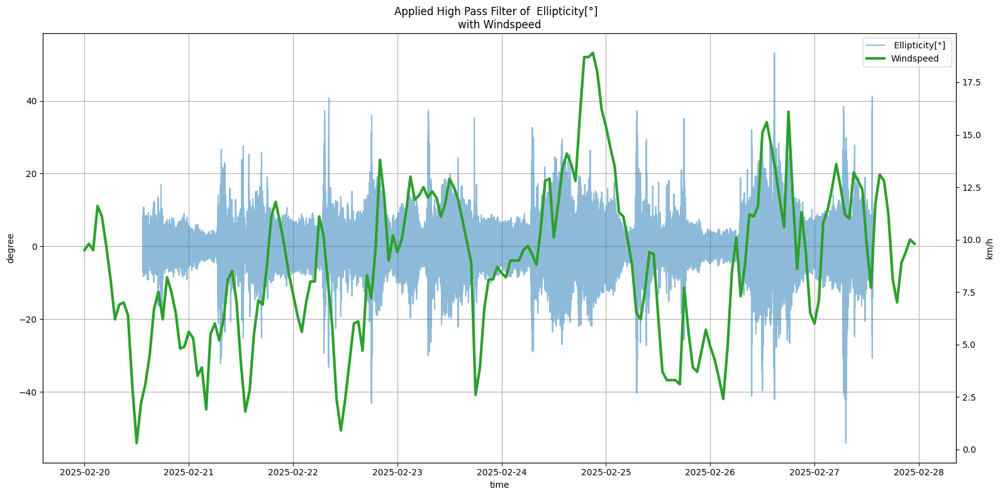

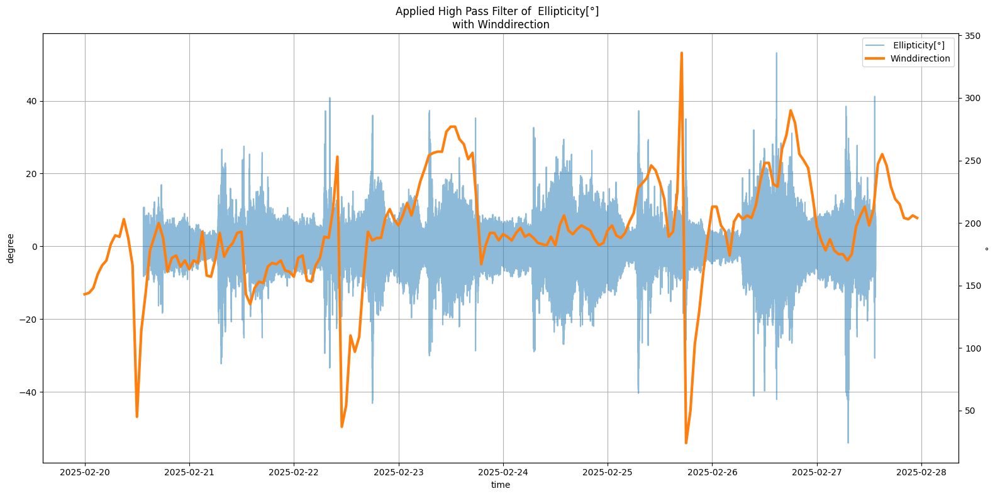

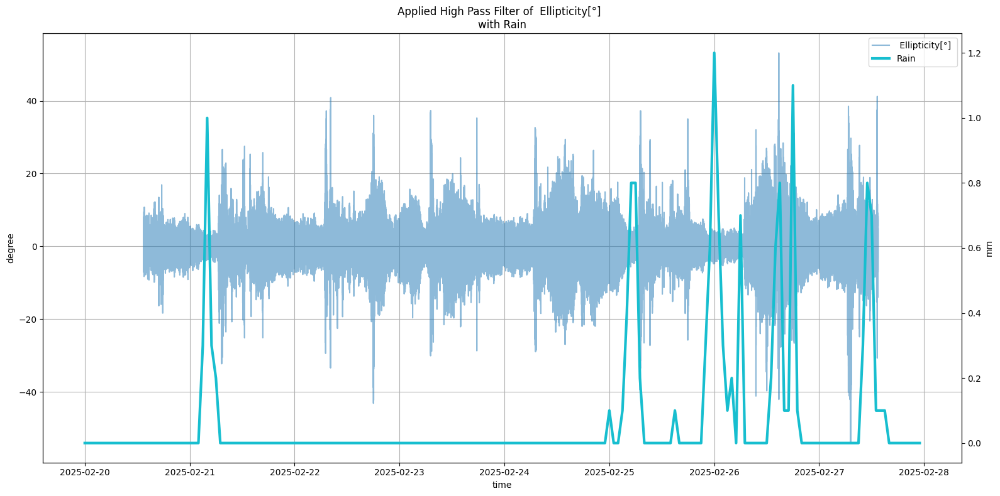

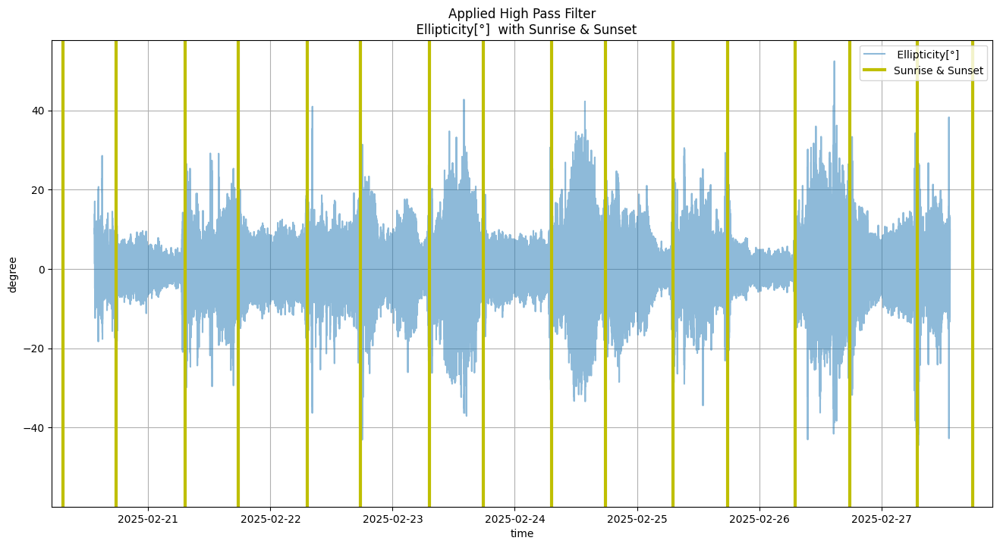

In [33]:
for current in range(len(w_data)):
    fig, ax1 = plt.subplots(figsize=(16, 8))

    ydata = np.array(angle[columns[10]])
    hps = highpass(ydata, 100)

    ax1.plot(angle.index, hps, label=columns[10], color= "tab:blue", alpha= 0.5)

    ax1.set_xlabel('time')
    ax1.set_ylabel('degree')
    h1, l1 = ax1.get_legend_handles_labels()

    ax2 = ax1.twinx()

    ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"], linewidth=3)
    ax2.set_ylabel(w_data[current]["unit"])
    h2, l2 = ax2.get_legend_handles_labels()

    ax1.grid()
    ax1.legend(h1+h2, l1+l2, loc="best")
    ax1.set_title(f'Applied High Pass Filter of {columns[10]} \nwith {w_data[current]["label"]}')

    plt.tight_layout()
    plt.show()

# Sunlight (day-night context)

plt.figure(figsize = (16,8))

ydata = np.array(angle[columns[10]])
hps = highpass(ydata, 1000)
plt.plot(angle.index, hps, label=columns[10], alpha= 0.5)

for i in range(len(sunrise)):
    plt.axvline(x = sunrise[i], color = 'y', linewidth=3)
    if i == 0: plt.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset', linewidth=3)
    else: plt.axvline(x = sunset[i], color = 'y', linewidth=3)
plt.grid()
plt.legend(loc = 'best')
plt.title(f'Applied High Pass Filter\n {columns[10]} with Sunrise & Sunset')
plt.xlabel('time')
plt.ylabel('degree')
plt.show()

### Untersuchung von Zusammenhängen zwischen Ellipticity und Wetter

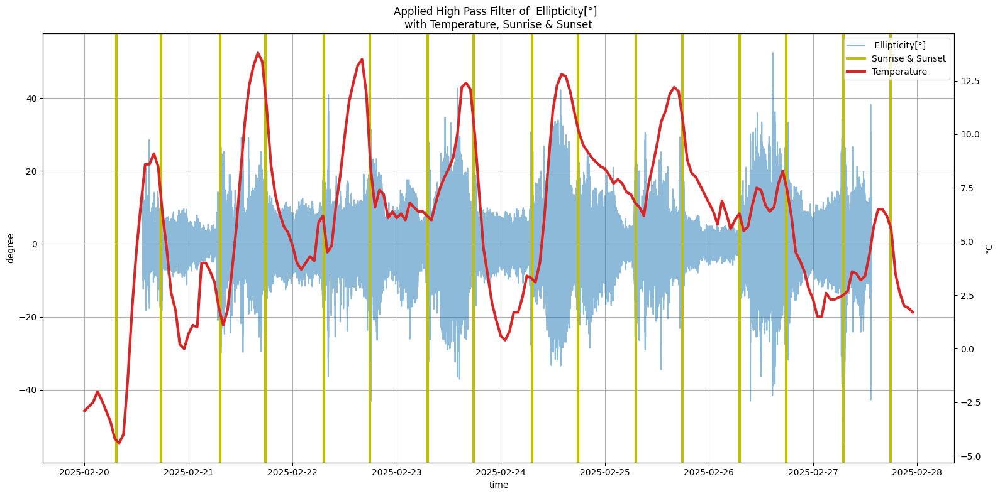

In [34]:
current = 0 #Temperature

fig, ax1 = plt.subplots(figsize=(16, 8))

ydata = np.array(angle[columns[10]])
hps = highpass(ydata, 1000)
ax1.plot(angle.index, hps, label=columns[10], alpha= 0.5)

for i in range(len(sunrise)):
    ax1.axvline(x = sunrise[i], color = 'y', linewidth=3)
    if i == 0: ax1.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset', linewidth=3)
    else: ax1.axvline(x = sunset[i], color = 'y', linewidth=3)

ax1.set_xlabel('time')
ax1.set_ylabel('degree')
h1, l1 = ax1.get_legend_handles_labels()

ax2 = ax1.twinx()

ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"], linewidth=3)
ax2.set_ylabel(w_data[current]["unit"])
h2, l2 = ax2.get_legend_handles_labels()

ax1.grid()
ax1.legend(h1+h2, l1+l2, loc="best")
ax1.set_title(f'Applied High Pass Filter of {columns[10]} \nwith {w_data[current]["label"]}, Sunrise & Sunset')
    
plt.tight_layout()
plt.show()

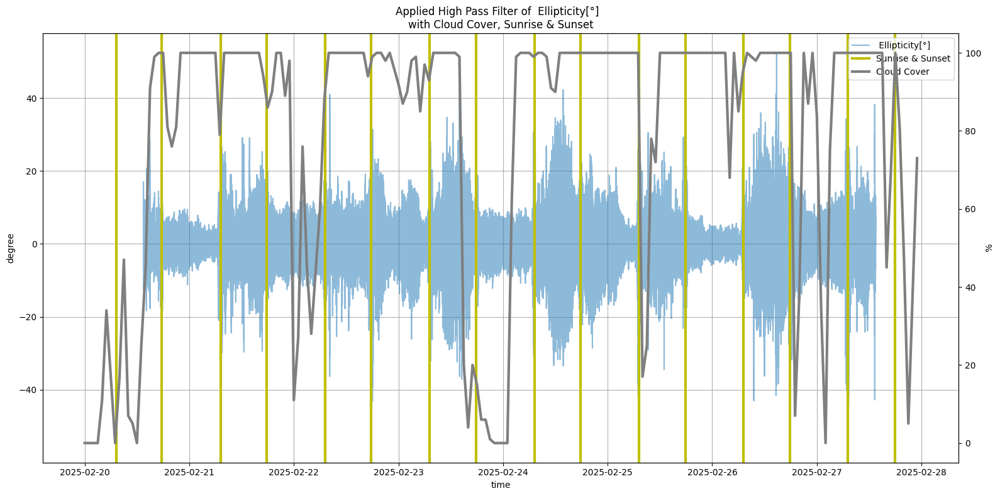

In [35]:
current = 2 #Cloud Cover

fig, ax1 = plt.subplots(figsize=(16, 8))

ydata = np.array(angle[columns[10]])
hps = highpass(ydata, 1000)
ax1.plot(angle.index, hps, label=columns[10], alpha= 0.5)

for i in range(len(sunrise)):
    ax1.axvline(x = sunrise[i], color = 'y', linewidth=3)
    if i == 0: ax1.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset', linewidth=3)
    else: ax1.axvline(x = sunset[i], color = 'y', linewidth=3)

ax1.set_xlabel('time')
ax1.set_ylabel('degree')
h1, l1 = ax1.get_legend_handles_labels()

ax2 = ax1.twinx()

ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"], linewidth=3)
ax2.set_ylabel(w_data[current]["unit"])
h2, l2 = ax2.get_legend_handles_labels()

ax1.grid()
ax1.legend(h1+h2, l1+l2, loc="best")
ax1.set_title(f'Applied High Pass Filter of {columns[10]} \nwith {w_data[current]["label"]}, Sunrise & Sunset')
    
plt.tight_layout()
plt.show()

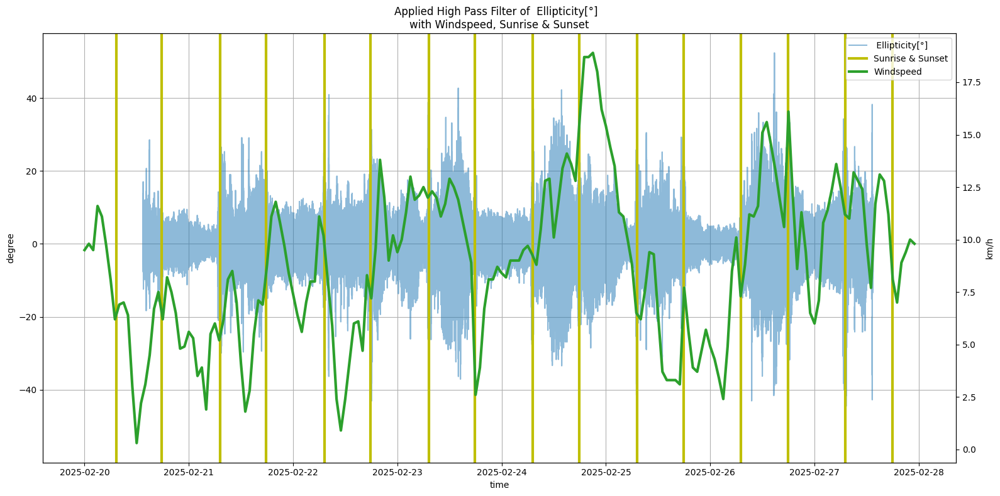

In [36]:
current = 3 #Windspeed

fig, ax1 = plt.subplots(figsize=(16, 8))

ydata = np.array(angle[columns[10]])
hps = highpass(ydata, 1000)
ax1.plot(angle.index, hps, label=columns[10], alpha= 0.5)

for i in range(len(sunrise)):
    ax1.axvline(x = sunrise[i], color = 'y', linewidth=3)
    if i == 0: ax1.axvline(x = sunset[i], color = 'y',label = 'Sunrise & Sunset', linewidth=3)
    else: ax1.axvline(x = sunset[i], color = 'y', linewidth=3)

ax1.set_xlabel('time')
ax1.set_ylabel('degree')
h1, l1 = ax1.get_legend_handles_labels()

ax2 = ax1.twinx()

ax2.plot(weather.index, weather[w_data[current]["header"]], label=w_data[current]["label"], color = w_data[current]["color"], linewidth=3)
ax2.set_ylabel(w_data[current]["unit"])
h2, l2 = ax2.get_legend_handles_labels()

ax1.grid()
ax1.legend(h1+h2, l1+l2, loc="best")
ax1.set_title(f'Applied High Pass Filter of {columns[10]} \nwith {w_data[current]["label"]}, Sunrise & Sunset')
    
plt.tight_layout()
plt.show()